# Forecast of PM10 data using Wiseair data

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
import tensorflow_probability as tfp

# suppress annoing warnings
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = False

import pandas as pd
import numpy as np

import datetime
from datetime import timedelta
# graphics settings
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcdefaults()
plt.style.use('fivethirtyeight')
mpl.rcParams['lines.linewidth'] = 2
mpl.rcParams.update({'font.size': 16})

import warnings
warnings.filterwarnings("ignore")

In [3]:
# plot standardized residuals of the fitted model
def plotResiduals_sts(trainData, fit):
    fit_mean = fit.mean().numpy()
    fit_stddev = fit.stddev().numpy()

    # compute standardized residuals
    res = (trainData - fit_mean)/fit_stddev

    residualsDF = pd.DataFrame({'yF' : res, 'xF' : range(res.size)})
    fittedDF    = pd.DataFrame({'yF' : fit_mean, 
                                'xF' : range(fit_mean.size),
                                'ylow' : fit_mean - 2*fit_stddev,
                                'yup'  : fit_mean + 2*fit_stddev})
    trueDF      = pd.DataFrame({'yF' : trainData, 'xF' : range(trainData.size)})

    fig, axs = plt.subplots(2,1)
    
    axs[0].scatter('xF', 'yF', data = residualsDF, color = "blue", edgecolor = "blue", label = "residuals")
    axs[0].axhline(y = 0, linestyle = "dashed", color = "black", linewidth = 0.8)
    axs[0].legend()
    
    axs[1].plot('xF', 'yF', data = trueDF, color="black", marker = 'o', linewidth=0.8, label = "true data")
    axs[1].plot('xF', 'yF', data = fittedDF, color = "blue", marker = 'o', linewidth=0.8, label = "predicted")
    axs[1].legend()
    plt.gcf().set_size_inches(20, 15)
    plt.show()

# plot forecast with 90% credible interval. n is the number of training points to show before the test set
def plotForecast_sts(testData, trainData, n, forecast, title, offset = 0):
    fit_mean = forecast.mean().numpy()[...,0]
    fit_stddev = forecast.stddev().numpy()[..., 0]
    
    # add first element of testData to trainData for a nicer plot
    trainData = np.append(trainData, testData[0])
        
    forecastDF = pd.DataFrame({
        'yF'   : fit_mean, 
        'xF'   : range(n + offset, fit_mean.size + n + offset),
        'ylow' : fit_mean - 2*fit_stddev,
        'yup'  : fit_mean + 2*fit_stddev
    })
    trueDF     = pd.DataFrame({'yF' : testData, 'xF' : range(n, testData.size + n)})
    trainDF    = pd.DataFrame({'yF' : trainData[-(n+1):], 'xF' : range(n+1)})
    
    # train data
    plt.plot('xF', 'yF', data = trainDF, color = "green", linewidth = 0.8, marker = 'o', 
             label = "train set (last day)")
    
    # forecast 
    plt.plot('xF', 'yF', data = forecastDF, color = "red", linewidth = 0.8, marker = 'o', 
             label = "forecast")
    plt.fill_between('xF', 'ylow', 'yup', data = forecastDF, facecolor = "#ff8a82", alpha = 0.2)
    
    # test data
    plt.plot('xF', 'yF', data = trueDF, color = "black", linewidth = 0.8, marker = 'o', label = "test set")
    plt.axvline(x = n, linestyle = "dashed", color = "orange")
    plt.gcf().set_size_inches(20, 10)
    plt.title(title)
    plt.legend()
    plt.show()
    
# sample is the sampling obtained by fit_to_data
def plotTraceplots_sts(sample):
    fig, axs = plt.subplots(len(sample.keys()),1)

    for i, traceplot in enumerate(sample.keys()):
        axs[i].plot(sample[traceplot], linewidth = 0.8)
        axs[i].set_title(traceplot)

    plt.gcf().set_size_inches(20, 40)
    plt.show()

In [4]:
# fit a DLM model using variational inference. Returns a sample from the posterior distribution of model parameters
def fit_to_data(model, data, num_samples):
    # compute an approximation of the posterior distribution for the model on data
    variational_posteriors = tfp.sts.build_factored_surrogate_posterior(model = model)
    loss_curve = tfp.vi.fit_surrogate_posterior(
        target_log_prob_fn  = model.joint_log_prob(observed_time_series = data),
        surrogate_posterior = variational_posteriors,
        optimizer           = tf.optimizers.Adam(learning_rate = 0.1),
        num_steps           = 200
    )

    # draw samples from the variational posterior
    posterior_parameters_sample = variational_posteriors.sample(num_samples)
    
    return (loss_curve, posterior_parameters_sample)

# extract from model the posterior latent distribution
def latent_posterior(model, data, parameters_sample, initial_state_prior = None):
    # get a low level description of the model
    if initial_state_prior is not None:
        model_ssm = model.make_state_space_model(
            num_timesteps = data.size,
            param_vals = parameters_sample,
            initial_state_prior = initial_state_prior
        )
    else:
        model_ssm = model.make_state_space_model(
            num_timesteps = data.size,
            param_vals = parameters_sample
        )
        
    # apply kalman filter until the end of data vector
    data_tensor = tf.transpose(tf.Variable(np.matrix(data)))
    _,filtered_means,filtered_covs,predictive_means,predictive_covs,_,_ = model_ssm.forward_filter(data_tensor)
    
    # return a multivariate normal posterior distribution for the latent state
    latent_posterior = tfp.distributions.MultivariateNormalFullCovariance(
        loc = predictive_means[:,-1,:], 
        covariance_matrix = predictive_covs[:,-1,:,:] # filtered o predictive ??
    )
    
    return latent_posterior

def get_forecast_distribution(model, observed_time_series, latent_posterior, horizon, parameters_sample):
    # instantiate a state space model for forecasting future values
    forecast_model = model.make_state_space_model(
        num_timesteps = horizon, 
        initial_state_prior = latent_posterior, # yesterday's posterior is today's prior
        param_vals = parameters_sample,
        initial_step = observed_time_series.shape[0]
    )

    num_posterior_draws = forecast_model.batch_shape_tensor().numpy()[-1]
    # return predictive distribution to sample from
    return tfp.distributions.MixtureSameFamily(
                mixture_distribution=tfp.distributions.Categorical(
                    logits=tf.zeros([num_posterior_draws], dtype=forecast_model.dtype)),
                components_distribution=forecast_model)

## Data import

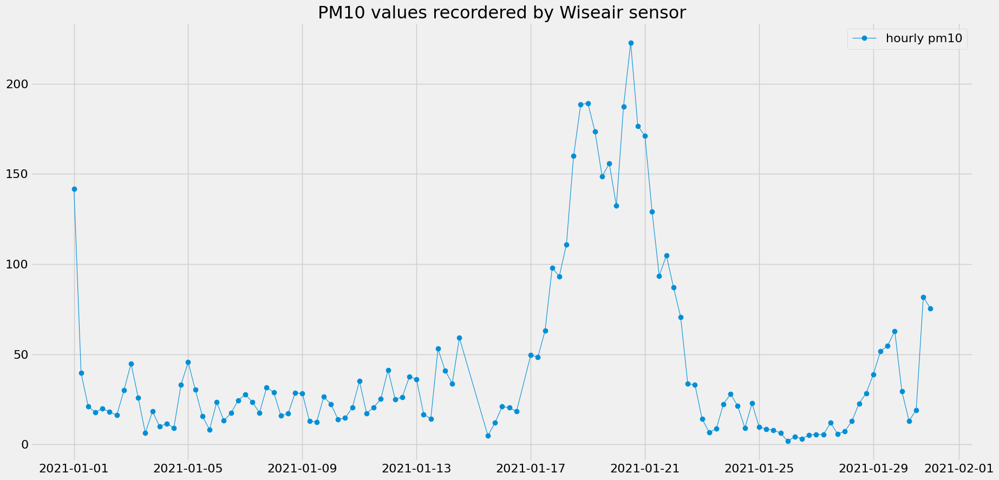

In [6]:
# load ARPA PM data
wiseairPM_data = pd.read_csv("../data/tsData2.csv")

wiseairPM_data["created_at"] = pd.to_datetime(wiseairPM_data["created_at"])
wiseairPM_data.set_index("created_at", inplace=True)

interestingPot = 1018
startDate      = datetime.datetime.strptime("2021-01-01", '%Y-%m-%d')
endDate        = datetime.datetime.strptime("2021-01-31", "%Y-%m-%d")
fdays          = 7 

# change aggregation in 6hours
wiseairPM_pot_rawdata = wiseairPM_data.loc[wiseairPM_data["pot_id"]==interestingPot]
wiseairPM_pot_data = wiseairPM_data.loc[wiseairPM_data["pot_id"]==interestingPot].resample('6H').mean()

wiseairPM_pot_dailydata = wiseairPM_data.loc[wiseairPM_data["pot_id"]==interestingPot].resample('D').mean()

# train dataset
Ytrain1W = wiseairPM_pot_data[startDate:endDate]
Ytrain1W.dropna(inplace = True)

# test dataset
Ytest1W = wiseairPM_pot_data[endDate: endDate + timedelta(fdays)]
Ytest1W.dropna(inplace = True)

plt.plot(Ytrain1W["pm10SPS"], linewidth = 0.8, marker = 'o', label = "hourly pm10")
plt.gcf().set_size_inches(20, 10)
plt.title("PM10 values recordered by Wiseair sensor")
plt.legend()
plt.show()

carichiamo i dati di PM10 da ARPA e li confrontiamo con quelli di wiseair giusto per vedere se dobbiamo aspettarci degli errori di misura da parte dei sensori wiseair.

NB: i dati ARPA sono ad aggreggazione giornaliera, quindi per il seguente plot cambieremo aggregazione dei dati di wiseair a giornaliera

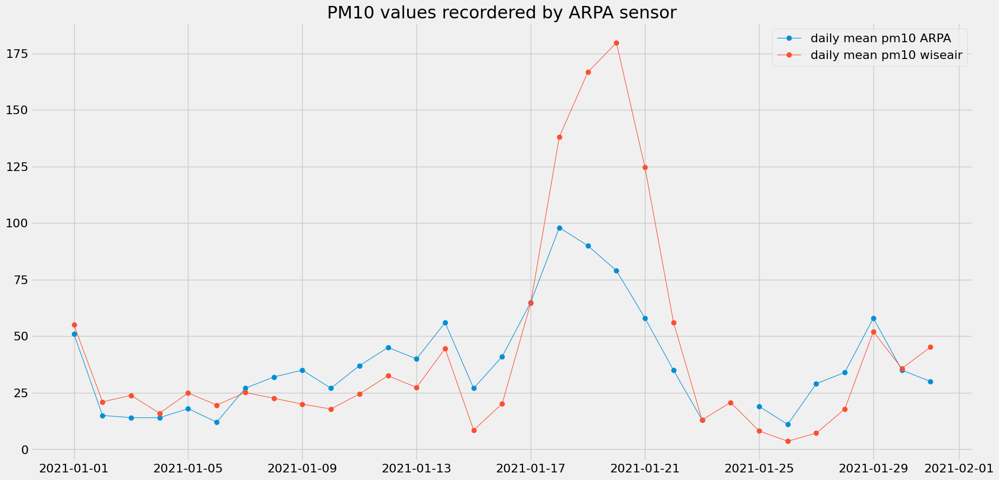

In [235]:
# load ARPA PM data
arpaPM_data = pd.read_csv("../data/datiArpaPM-01052020-07022021.csv", names=["Date", "PM10.Arpa"], header=0)[2:]

arpaPM_data["Date"] = pd.to_datetime(arpaPM_data["Date"])
arpaPM_data.set_index("Date", inplace=True)
arpaPM_data["PM10.Arpa"] = pd.to_numeric(arpaPM_data["PM10.Arpa"])

# mark missing values -999 as NaN
arpaPM_data.loc[arpaPM_data["PM10.Arpa"] == -999, "PM10.Arpa"] = None

plt.plot(arpaPM_data["PM10.Arpa"][startDate:endDate], linewidth = 0.8, marker = 'o', 
         label = "daily mean pm10 ARPA")
plt.plot(wiseairPM_data.loc[wiseairPM_data["pot_id"] == interestingPot]
         ["pm10SPS"].resample('D').mean()[startDate:endDate], 
         linewidth = 0.8, marker = 'o', label = "daily mean pm10 wiseair")
plt.gcf().set_size_inches(20, 10)
plt.title("PM10 values recordered by ARPA sensor")
plt.legend()
plt.show()

da questo momento in poi comunque non importeremo più esplicitamente dati ARPA (sono già stati integrati a valle nella preparazione di tsData.csv)

I dati di pioggia e vento sono presi da ARPA e integrati con quelli wiseair, quindi le stesse considerazioni fatte per ARPA valgono qui. Le ripetiamo solo per vedere se la diversa aggregazione oraria ha o meno un impatto sulle considerazioni fatte. 

### Precipitations

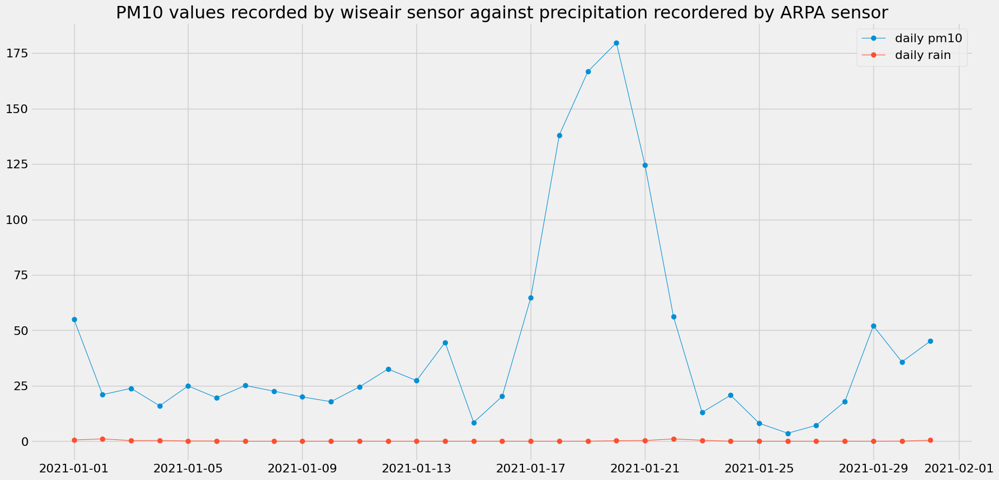

In [8]:
plt.plot(wiseairPM_pot_dailydata["pm10SPS"][startDate:endDate], linewidth = 0.8, marker = 'o', 
         label = "daily pm10")
plt.plot(wiseairPM_pot_dailydata["rain"][startDate:endDate], linewidth = 0.8, marker = 'o', 
         label = "daily rain")
plt.gcf().set_size_inches(20, 10)
plt.title("PM10 values recorded by wiseair sensor against precipitation recordered by ARPA sensor")
plt.legend()
plt.show()

generalmente più alta la quantità di precipitazione, minore i livelli di PM10. Dallo scatterplot si nota che i valori di inquinanti sono bassi quando mediamente ha piovuto tanto durante la giornata. Questo suggerisce che la pioggia ha un effetto di lavaggio dell'aria. Tuttavia anche in assenza di precipitazione i livelli di PM10 possono mantenersi bassi (Quindi non significa che l'inquinamento è basso solo se piove). Questa analisi non tiene però conto della **forza del fenomeno atmosferico**. Infatti pioggerelle non contribuiscono all'abbassamento dei valori di PM, anzi può capitare che si innalzino dopo una debole pioggia (lo dice nell'articolo).

L'intensità della pioggia, nota come rainfall intensity, invece dovrebbe essere più significativa della violenza del fenomeno atmosferico. E' una quantità sempre positiva e la definiamo come l'area sottesa dalla curva della pioggia $p(\cdot)$ tra il tempo t e il tempo t-1 (cioè quanti mm di pioggia sono caduti in un ora).

Sia $ p_{min} = \min{(p_t, p_{t-1})} $ e $ p_{max} = \max{(p_t, p_{t-1})} $, allora definiamo

$$
RI = p_{min} + \frac{1}{2}(p_{max} - p_{min})
$$

In [9]:
# compute precipitation intensity
def RI(p1, p2):
    return min(p1,p2) + 0.5*(max(p1,p2) - min(p1,p2))

rain = wiseairPM_pot_rawdata["rain"].to_numpy()
rain_shift = wiseairPM_pot_rawdata["rain"].shift(1).to_numpy()

rainfall_intensity = []

for i in range(len(rain)):
    rainfall_intensity.append(RI(rain[i], rain_shift[i]))
    
rainfall_intensity = pd.Series(rainfall_intensity, index = wiseairPM_pot_rawdata["rain"].index)

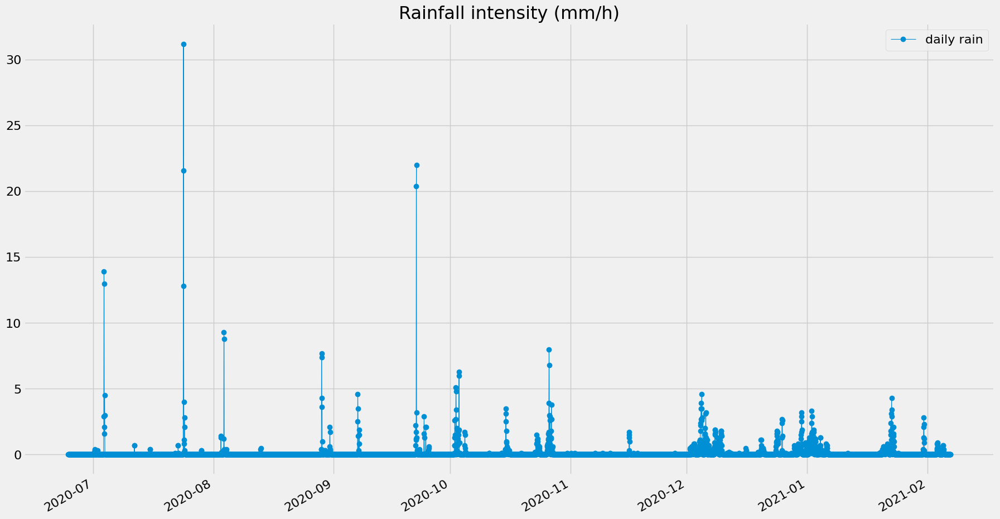

In [10]:
plt.plot(rainfall_intensity, linewidth = 0.8, marker = 'o', label = "daily rain")
plt.gcf().set_size_inches(20, 10)
plt.title("Rainfall intensity (mm/h)")
plt.legend()
plt.setp(plt.gca().get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

siccome i dati hanno una aggregazione a 6 ore, etichettiamo l'intensità di precipitazione in questo intervallo temporale come la massima rainfall intensity che si ha avuto durante questo periodo (in questo modo se durante le 6 ore c'è stato un forte temporale, il massimo ci consente di tenerne conto, se facciamo la media questa informazione viene persa perchè magari ha piovuto intensamente per un paio di ore e poi non ha fatto nemmeno una goccia per le altre 22, la media sul giorno sarà comunque molto bassa anche per la rainfall intensity)

In [11]:
wiseairPM_pot_data['RI'] = rainfall_intensity.resample('6H').max()
wiseairPM_pot_dailydata['RI'] = rainfall_intensity.resample('D').max()

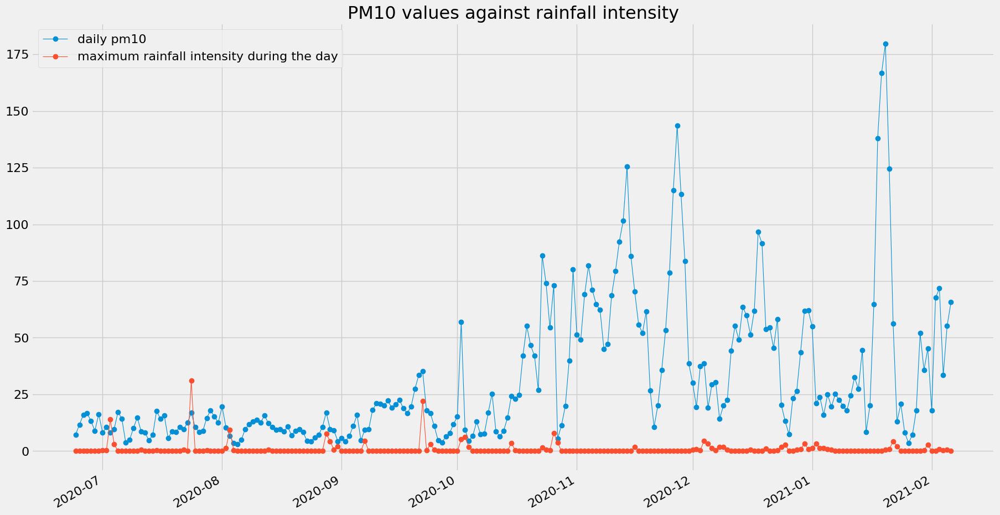

In [12]:
plt.plot(wiseairPM_pot_dailydata["pm10SPS"], linewidth = 0.8, marker = 'o', label = "daily pm10")
plt.plot(wiseairPM_pot_dailydata["RI"], linewidth = 0.8, marker = 'o', 
         label = "maximum rainfall intensity during the day")
plt.gcf().set_size_inches(20, 10)
plt.title("PM10 values against rainfall intensity")
plt.legend()
plt.setp(plt.gca().get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

sarebbe più interessante vedere la riduzione in PM accompaganta da fenomeni atmosferici violenti, plottiamo quindi la rainfall intensity contro la riduzione di PM, come differenza tra il PM al tempo t e quello al tempo t-1. Il plot seguente mostra sulle x la rainfall intensity al tempo t e sulle y la quantità di PM10 iniziale (vale a dire quella al tempo t-1, quindi prima che si verificasse il fenomeno atmosferico al tempo t). I colori mostrano se si ha avuto una riduzione o un incremento nei livelli di PM.

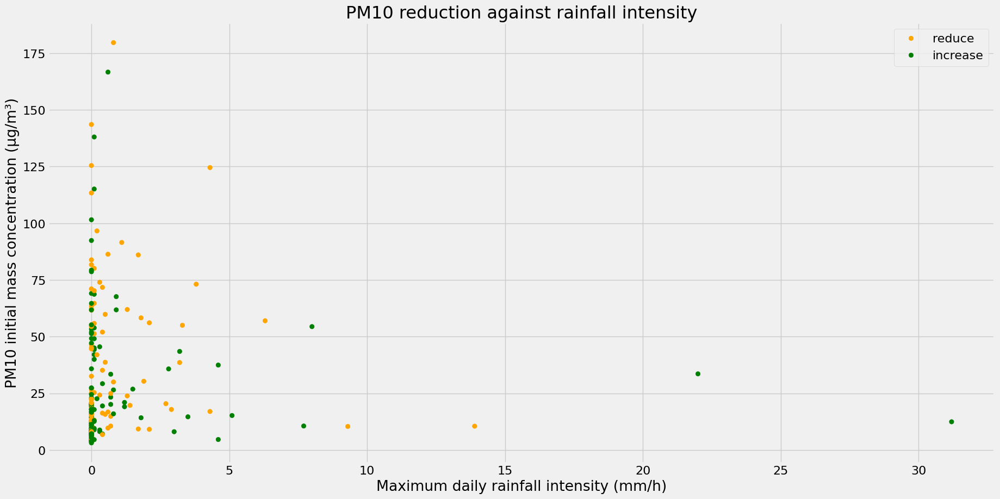

In [13]:
RI_with_reduction = pd.DataFrame({
    'PM10_initial_mass' : wiseairPM_pot_dailydata['pm10SPS'].shift(1),
    'RI' : wiseairPM_pot_dailydata['RI'],
    'reduction': (wiseairPM_pot_dailydata['pm10SPS'].shift(1) - wiseairPM_pot_dailydata['pm10SPS'])
})

def labeler(row):
    if row < 0:
        return 1 # reduce
    else:
        return 0 # increase

RI_with_reduction['label'] = RI_with_reduction['reduction'].apply(labeler)

scatter = plt.scatter('RI', 'PM10_initial_mass', c = RI_with_reduction['label'], data = RI_with_reduction, 
                      cmap = mpl.colors.ListedColormap(["orange", "green"]))
plt.gcf().set_size_inches(20, 10)
plt.title("PM10 reduction against rainfall intensity")
plt.xlabel("Maximum daily rainfall intensity (mm/h)")
plt.ylabel("PM10 initial mass concentration (\u03BCg/m\N{SUPERSCRIPT THREE})")
plt.legend(handles=scatter.legend_elements()[0], labels = ["reduce", "increase"])
plt.show()

### Wind direction

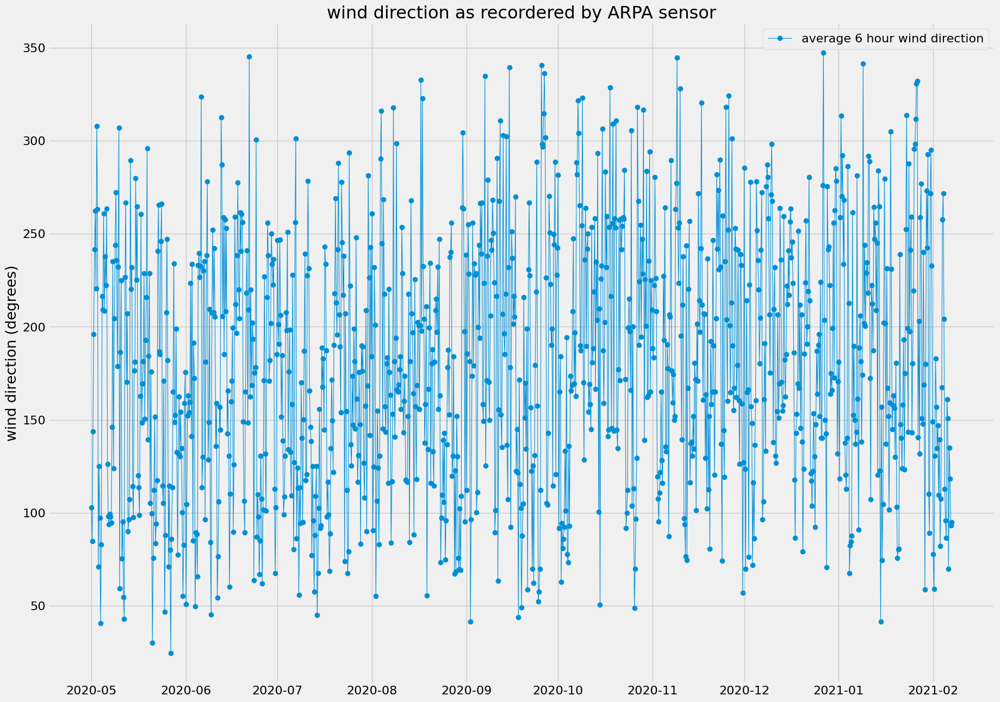

In [14]:
windDirection = pd.read_csv('../data/datiArpaDirezioneVento-01052020-07022021.csv', 
                        names=["ID", "Date", "wind_degree"], header=0)
windDirection.drop(["ID"], axis = 1, inplace = True)
windDirection["Date"] = pd.to_datetime(windDirection["Date"])
windDirection.set_index("Date", inplace=True)
    
plt.plot(windDirection.resample('6H').mean(), linewidth = 0.8, marker = 'o', 
            label = "average 6 hour wind direction")
plt.title("wind direction as recordered by ARPA sensor")
plt.ylabel("wind direction (degrees)")
plt.legend()

plt.gcf().set_size_inches(20, 15)
plt.show()

# i gradi di direzione del vento sono riferiti al nord

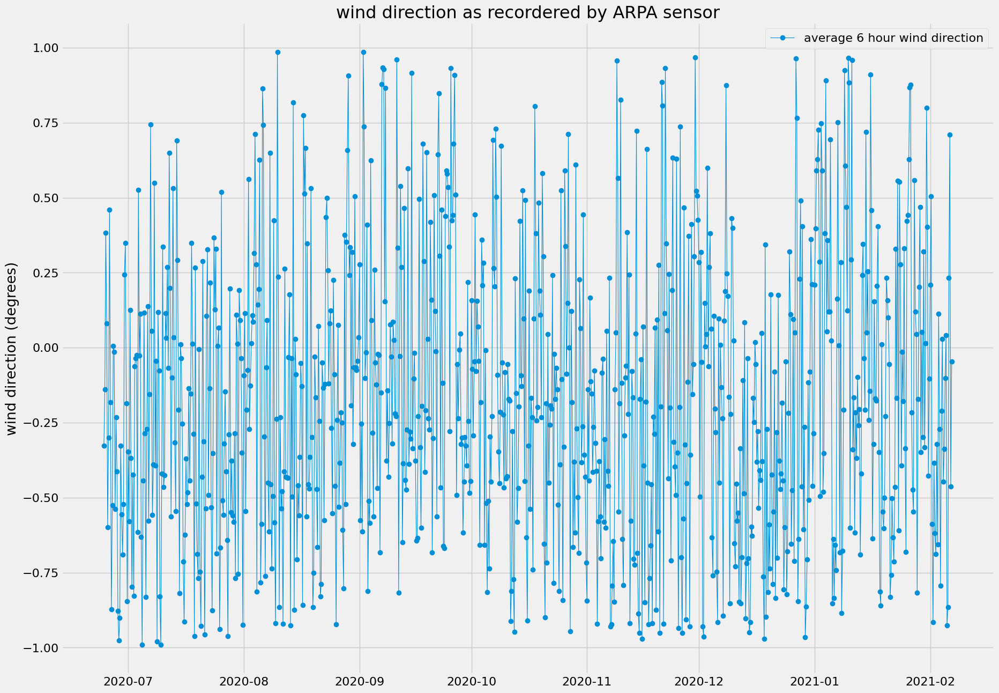

In [15]:
# transform degree data to a pair of regressors sin,cos
windDirection_sin = np.sin(np.pi*windDirection/180)
windDirection_cos = np.cos(np.pi*windDirection/180)

wiseairPM_pot_data['wd'] = windDirection
wiseairPM_pot_data['sin_wd'] = windDirection_sin.resample('6H').mean()
wiseairPM_pot_data['cos_wd'] = windDirection_cos.resample('6H').mean()

plt.plot(wiseairPM_pot_data['cos_wd'], linewidth = 0.8, marker = 'o', 
            label = "average 6 hour wind direction")
plt.title("wind direction as recordered by ARPA sensor")
plt.ylabel("wind direction (degrees)")
plt.legend()

plt.gcf().set_size_inches(20, 15)
plt.show()

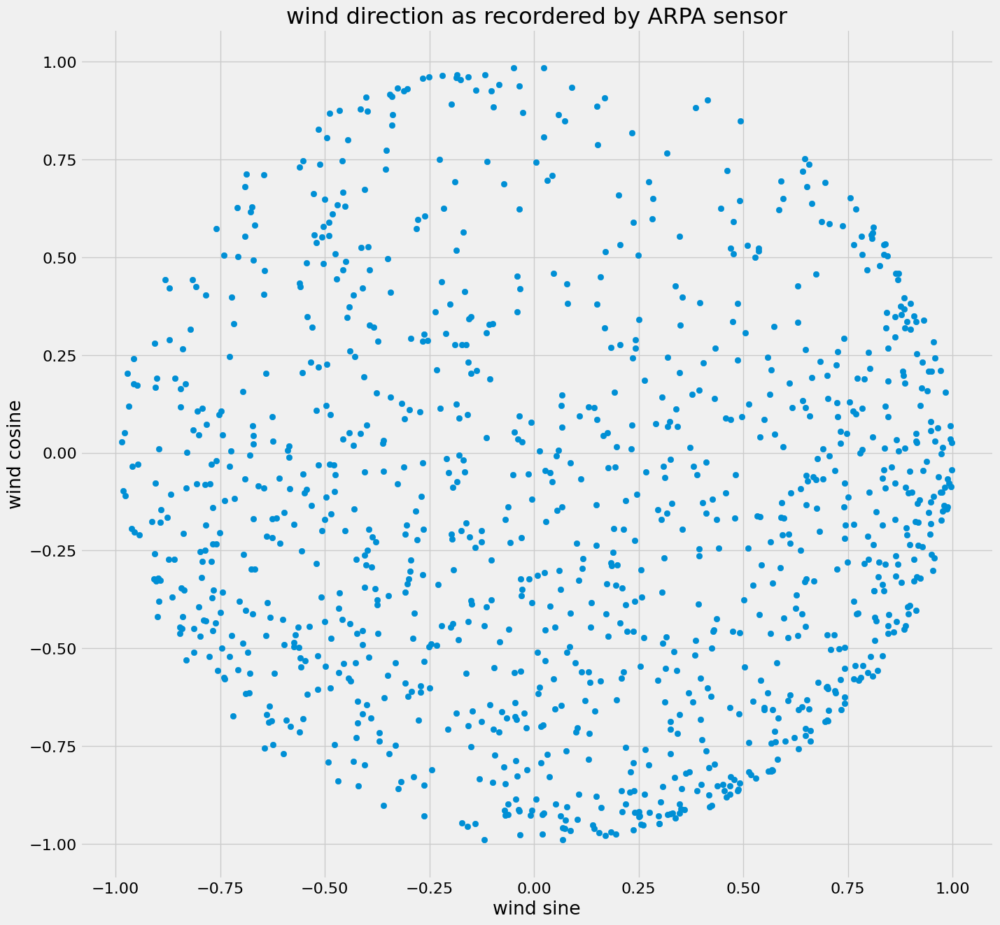

In [16]:
plt.scatter(windDirection_sin.resample('6H').mean(), windDirection_cos.resample('6H').mean())
plt.title("wind direction as recordered by ARPA sensor")
plt.ylabel("wind cosine")
plt.xlabel("wind sine")

plt.gcf().set_size_inches(15, 15)
plt.show()

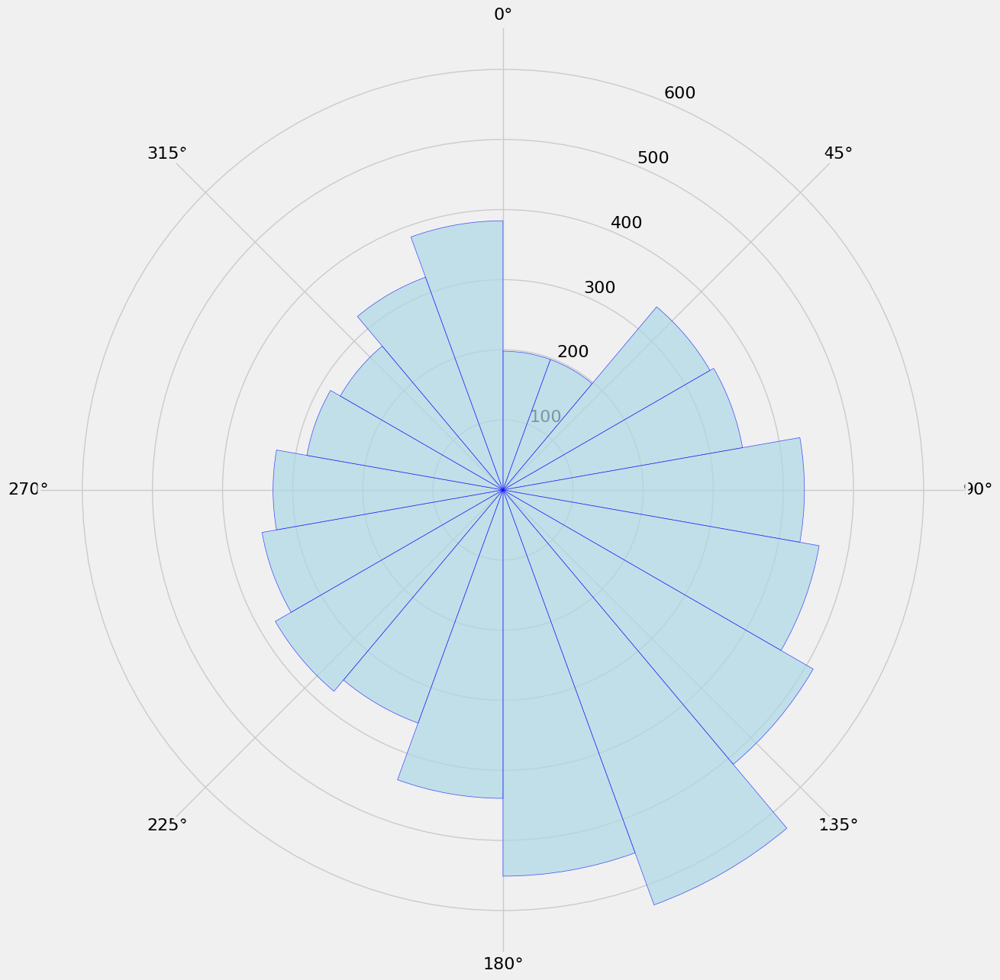

In [17]:
import numpy as np
import matplotlib.pyplot as plt

degrees = windDirection
radians = np.deg2rad(degrees)

bin_size = 20
a , b=np.histogram(degrees, bins=np.arange(0, 360+bin_size, bin_size))
centers = np.deg2rad(np.ediff1d(b)//2 + b[:-1])

fig = plt.figure()
ax = fig.add_subplot(111, projection='polar')
ax.bar(centers, a, width=np.deg2rad(bin_size), bottom = 0.0, color='lightblue', alpha = 0.7, edgecolor='blue')
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)

plt.gcf().set_size_inches(15, 15)
plt.show()

In [459]:
# dividiamo la direzione del vento in quattro quadranti
wd_N_NE = windDirection.loc[(windDirection["wind_degree"] > 0) & (windDirection["wind_degree"] <= 90)].resample('D').mean()
wd_N_NW = windDirection.loc[(windDirection["wind_degree"] > 270) & (windDirection["wind_degree"] <= 360)].resample('D').mean()
wd_S_SE = windDirection.loc[(windDirection["wind_degree"] > 90)  & (windDirection["wind_degree"] <= 180)].resample('D').mean()
wd_N_SW = windDirection.loc[(windDirection["wind_degree"] > 180) & (windDirection["wind_degree"] <= 270)].resample('D').mean()

In [18]:
def direction(x, min_degree, max_degree):
    if x >= min_degree and x < max_degree:
        return 1
    else:
        return 0

NE = windDirection["wind_degree"].resample("D").mean().apply(lambda x: direction(x, 0, 90))
SE = windDirection["wind_degree"].resample("D").mean().apply(lambda x: direction(x, 90, 180))
SW = windDirection["wind_degree"].resample("D").mean().apply(lambda x: direction(x, 180, 270))
NW = windDirection["wind_degree"].resample("D").mean().apply(lambda x: direction(x, 270, 360))

dummy_direction = pd.DataFrame({
    'NE' : NE,
    'SE' : SE,
    'SW' : SW,
    'NW' : NW
})

## global solar radiation

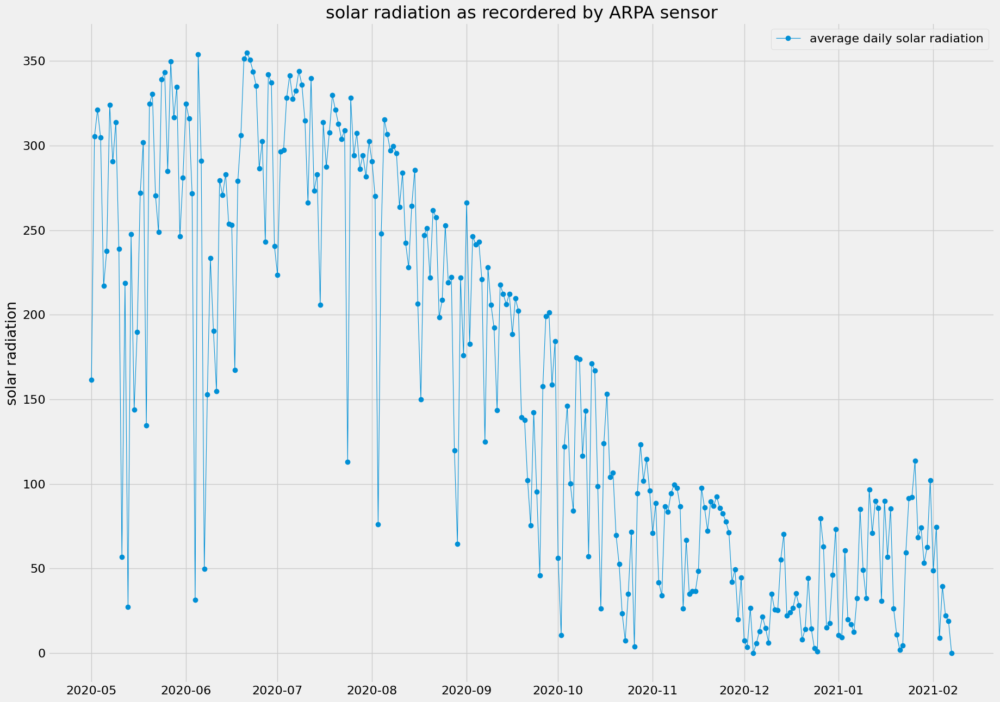

In [19]:
solarRadiation = pd.read_csv('../data/datiArpaRadiazioneGlobale-01052020-07022021.csv', 
                        names=["ID", "Date", "radiation"], header=0)
solarRadiation.drop(["ID"], axis = 1, inplace = True)
solarRadiation["Date"] = pd.to_datetime(solarRadiation["Date"])
solarRadiation.set_index("Date", inplace=True)

plt.plot(solarRadiation.resample('D').mean(), linewidth = 0.8, marker = 'o', 
            label = "average daily solar radiation")
plt.title("solar radiation as recordered by ARPA sensor")
plt.ylabel("solar radiation")
plt.legend()

plt.gcf().set_size_inches(20, 15)
plt.show()

## Prior from past data

per la parte seasonal, cerchiamo il valore medio dell'inquinante per ciascuna delle nostre fascie orarie, e la mettiamo come media della normale che definisce la prior per ciascun seasonal latent variable.

Usiamo dati degli ultimi 3 mesi precedenti al periodo scelto per il train/test

In [230]:
startDatePrior = datetime.datetime.strptime("2020-09-01", '%Y-%m-%d')
endDatePrior   = datetime.datetime.strptime("2020-12-31", "%Y-%m-%d")

prior_data = wiseairPM_pot_data[startDatePrior:endDatePrior]
prior_data = prior_data.resample('6H').mean()

prior_data['hour'] = prior_data.index.time

In [228]:
prior_level0 = prior_data.loc[prior_data['hour'] == 
                              datetime.datetime.strptime("00:00:00", "%H:%M:%S").time()]
prior_level0.dropna(inplace = True)

prior_level1 = prior_data.loc[prior_data['hour'] == 
                              datetime.datetime.strptime("06:00:00", "%H:%M:%S").time()]
prior_level1.dropna(inplace = True)

prior_level2 = prior_data.loc[prior_data['hour'] == 
                              datetime.datetime.strptime("12:00:00", "%H:%M:%S").time()]
prior_level2.dropna(inplace = True)

prior_level3 = prior_data.loc[prior_data['hour'] == 
                              datetime.datetime.strptime("18:00:00", "%H:%M:%S").time()]
prior_level3.dropna(inplace = True)

meanPM_prior = pd.DataFrame({
    'time' : ["00:00 - 06:00",
              "06:00 - 12:00",
              "12:00 - 18:00",
              "18:00 - 00:00"],
    'meanPM' : [np.mean(prior_level0['pm10SPS'].values - np.mean(prior_data['pm10SPS'].dropna().values)),
                np.mean(prior_level1['pm10SPS'].values - np.mean(prior_data['pm10SPS'].dropna().values)),
                np.mean(prior_level2['pm10SPS'].values - np.mean(prior_data['pm10SPS'].dropna().values)),
                np.mean(prior_level3['pm10SPS'].values - np.mean(prior_data['pm10SPS'].dropna().values))]
})

mean0 = np.mean(prior_level0['pm10SPS'].values, dtype = "float32")
mean1 = np.mean(prior_level1['pm10SPS'].values, dtype = "float32")
mean2 = np.mean(prior_level2['pm10SPS'].values, dtype = "float32")
mean3 = np.mean(prior_level3['pm10SPS'].values, dtype = "float32")

std0 = np.std(prior_level0['pm10SPS'].values, dtype = "float32")
std1 = np.std(prior_level1['pm10SPS'].values, dtype = "float32")
std2 = np.std(prior_level2['pm10SPS'].values, dtype = "float32")
std3 = np.std(prior_level3['pm10SPS'].values, dtype = "float32")

meanPM_prior.set_index("time", inplace=True)
meanPM_prior

,meanPM
time,
00:00 - 06:00,NaN
06:00 - 12:00,NaN
12:00 - 18:00,NaN
18:00 - 00:00,NaN


In [293]:
averageWindSpeed = np.mean(prior_data['wind'].values, dtype = "float32")
stdWindSpeed = np.std(prior_data['wind'].values, dtype = "float32")

averageWindsin = np.mean(prior_data['sin_wd'].values, dtype = "float32")
stdWindsin = np.std(prior_data['sin_wd'].values, dtype = "float32")

averageWindcos = np.mean(prior_data['cos_wd'].values, dtype = "float32")
stdWindcos = np.std(prior_data['cos_wd'].values, dtype = "float32")

# Modello

In [294]:
wiseairPM_pot_data.head()

,pot_id,pm1SPS,pm2p5SPS,pm4SPS,pm10SPS,temperature_sht,humidity_sht,latitude,longitude,weekend,wind,rain,RI,sin_wd,cos_wd,wd
created_at,,,,,,,,,,,,,,,,
2020-06-24 12:00:00,1018,6.649960,7.322917,7.575096,7.623598,32.621963,31.290865,45.484161,9.209361,0,2.125000,0.0,0.0,0.908007,-0.327169,110
2020-06-24 18:00:00,1018,5.469028,6.208333,6.418333,6.475694,31.926111,29.318611,45.484161,9.209361,0,1.816667,0.0,0.0,0.987658,-0.138791,99
2020-06-25 00:00:00,1018,3.885000,4.000000,4.110000,4.110000,29.920000,32.695000,45.484161,9.209361,0,1.133333,0.0,0.0,0.899524,0.382489,66
2020-06-25 06:00:00,1018,12.915000,14.330556,15.062639,15.189000,24.638194,43.087500,45.484161,9.209361,0,2.016667,0.0,0.0,0.947740,0.080470,76
2020-06-25 12:00:00,1018,6.970500,7.750000,8.000500,8.056500,29.623000,37.384500,45.484161,9.209361,0,1.933333,0.0,0.0,0.700675,-0.598768,100


In [296]:
# define target
pm10 = np.array(Ytrain1W["pm10SPS"], dtype = "float32")

Y = wiseairPM_pot_data[startDate:endDate + timedelta(fdays)]

# define a design matrix for each regressors
rainDF = pd.DataFrame({
    'rain_intensity' : np.array(Y['RI'], dtype = "float32")
})
rainDF.dropna(inplace = True)

windDF = pd.DataFrame({
    'wind'     : np.array(Y['wind'] - np.mean(Y['wind']), dtype = "float32"),
    'wind-sin' : np.array(Y['sin_wd'], dtype = "float32"),
    'wind-cos' : np.array(Y['cos_wd'], dtype = "float32")
})
windDF.dropna(inplace = True)

tempDF = pd.DataFrame({
    'temp' : np.array(Y['temperature_sht'], dtype = "float32"),
    'temp-diff': np.array(Y['temperature_sht'].shift(-1) - Y['temperature_sht'], dtype = "float32")
})
tempDF.interpolate(inplace = True)

humiDF = pd.DataFrame({
    'humi' : np.array(Y['humidity_sht'], dtype = "float32")
})
humiDF.interpolate(inplace = True)

In [324]:
# dynamical regressive part
wind_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(windDF.to_numpy(), (-1, windDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [0, 0, 0]),
    name = "wind_effect"
)

rain_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(rainDF.to_numpy(), (-1, rainDF.shape[1])),
    #initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [-10.0], scale_diag = [10.0]),
    name = "rain_effect"
)

temp_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(tempDF.to_numpy(), (-1, tempDF.shape[1])),
    #initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [-10.0], scale_diag = [10.0]),
    name = "temperature_effect"
)

humi_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(humiDF.to_numpy(), (-1, humiDF.shape[1])),
    #initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [1.0], scale_diag = [10.0]),
    name = "humidity_effect"
)

# autoregressive part
autoregressive = tfp.sts.Autoregressive(
      order = 2,
      observed_time_series = np.array(Ytrain1W["pm10SPS"].rolling(4).mean().fillna(Ytrain1W["pm10SPS"]), 
                                    dtype = "float32"),
      name='autoregressive'
)

# trend part
trend = tfp.sts.SemiLocalLinearTrend(
    observed_time_series = np.array(Ytrain1W["pm10SPS"].rolling(4).mean().fillna(Ytrain1W["pm10SPS"]), 
                                    dtype = "float32"),
    slope_scale_prior = tfp.distributions.LogNormal(loc=-1., scale=100.0),
    slope_mean_prior = tfp.distributions.Normal(loc=0.0, scale=1.0)
)

# seasonal part
day_of_week_effect = tfp.sts.Seasonal(
    num_seasons = 7,
    num_steps_per_season = 4,
    observed_time_series = pm10,
    name='day_of_week_effect',
    drift_scale_prior=tfp.distributions.LogNormal(loc=-1., scale=10.0)
)

hour_of_day_effect = tfp.sts.Seasonal(
    num_seasons = 4,
    observed_time_series = pm10,
    name='hour_of_day_effect',
    drift_scale_prior=tfp.distributions.LogNormal(loc=-1., scale=10.0),
    initial_effect_prior = tfp.distributions.MultivariateNormalDiag(loc = [mean0, mean1, mean2, mean3], 
                                                                    scale_diag = [5.0, 5.0, 5.0, 5.0])
)

In [325]:
# set large observational noise variance
observation_noise_scale_prior = tfp.distributions.InverseGamma(concentration = 1.0, scale = 1.0)

model = tfp.sts.Sum([autoregressive,
                     #trend,
                     wind_effect,
                     rain_effect,
                     humi_effect,
                     temp_effect,
                     #day_of_week_effect,
                     hour_of_day_effect
                    ], 
                    observed_time_series = pm10,
                    observation_noise_scale_prior = observation_noise_scale_prior)

In [326]:
parameters_sample = fit_to_data(model, pm10, 3000)
sample = parameters_sample[1]

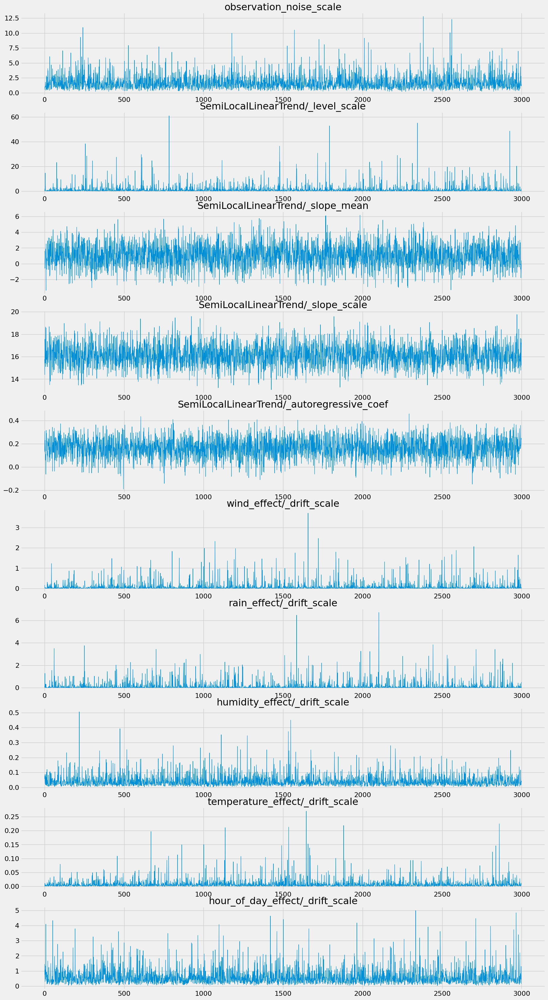

In [260]:
plotTraceplots_sts(sample)

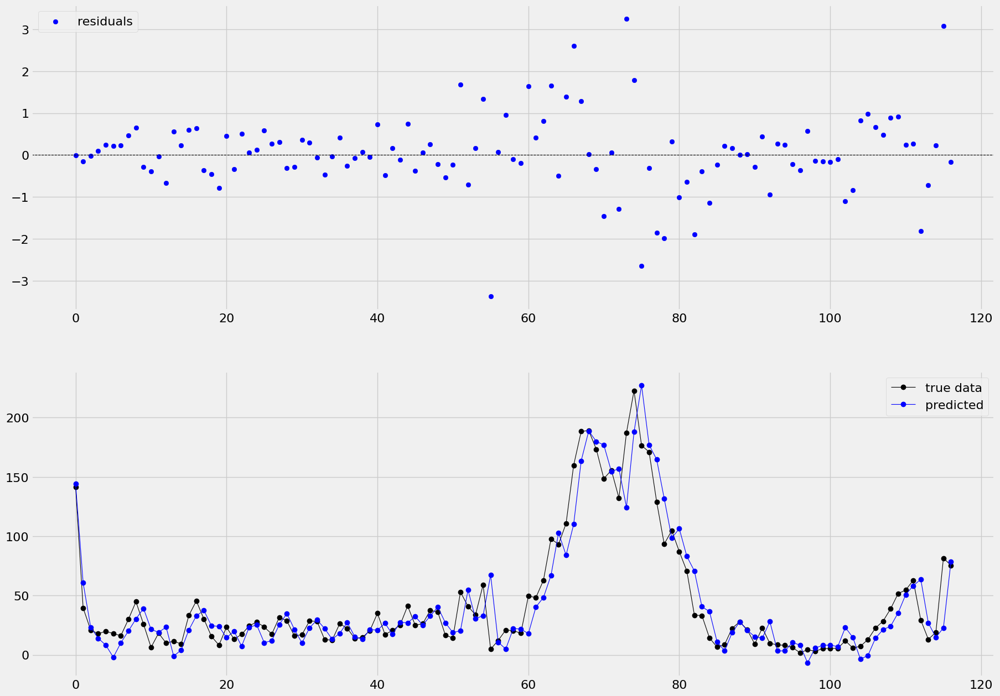

In [327]:
fit = tfp.sts.one_step_predictive(
    observed_time_series = pm10,
    model                = model,
    parameter_samples    = sample
)

plotResiduals_sts(pm10, fit)

In [141]:
def detect_peaks(series, treshold):
    detected_peaks = []
    
    detected = False
    for index, value in series.items():
        if value >= treshold and detected == False:
            detected = True
            detected_peaks.append(index)
        elif detected == True and value < treshold:
            detected = False
            detected_peaks.append(index)
    
    if detected == True:
        detected_peaks.append(series.iloc[-1].index)
        
    return detected_peaks

In [198]:
p = detect_peaks(Ytrain1W["pm10SPS"], 80)

In [142]:
def plot_peaks(axs, peaks):
    for i in range(0, len(peaks)-1, 2):
        axs.axvspan(peaks[i], peaks[i+1], color='orange', alpha=0.2)

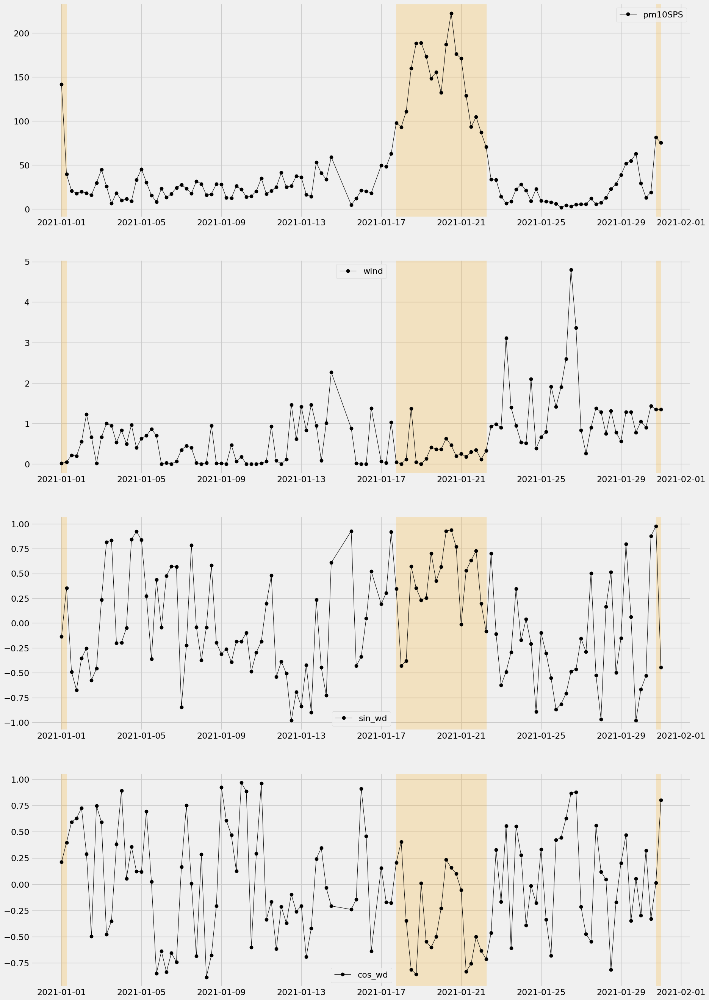

In [200]:
def plotRegressors(data, regressors, peaks):

    fig, axs = plt.subplots(len(regressors),1)
    
    for i,j in enumerate(regressors):
    
        axs[i].plot(data[j], color = "black", marker = 'o', linewidth=0.8, label = j)
        plot_peaks(axs[i], p)
        axs[i].legend()

    plt.gcf().set_size_inches(20, 8*len(regressors))
    plt.show()
    
plotRegressors(Y.dropna()[startDate:endDate], ["pm10SPS", "wind", "sin_wd", "cos_wd"], p)

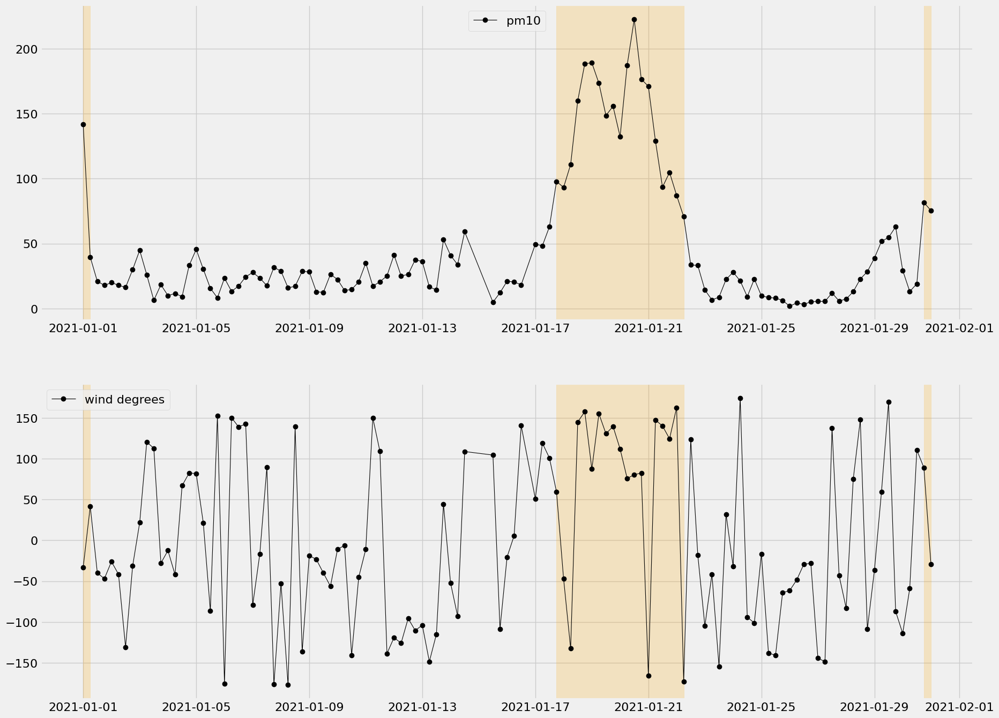

In [201]:
fig, axs = plt.subplots(2,1)

axs[0].plot(Y.dropna()["pm10SPS"][startDate:endDate], color = "black", marker = 'o', linewidth=0.8, label = "pm10")
plot_peaks(axs[0], p)
axs[0].legend()

degrees = np.arctan2(Y.dropna()["sin_wd"][startDate:endDate], Y.dropna()["cos_wd"][startDate:endDate])*180/np.pi

axs[1].plot(degrees, color = "black", marker = 'o', linewidth=0.8, label = "wind degrees")
plot_peaks(axs[1], p)
axs[1].legend()

plt.gcf().set_size_inches(20, 16)
plt.show()

# lo 0 è riferito al nord, quindi 180 sono il sud

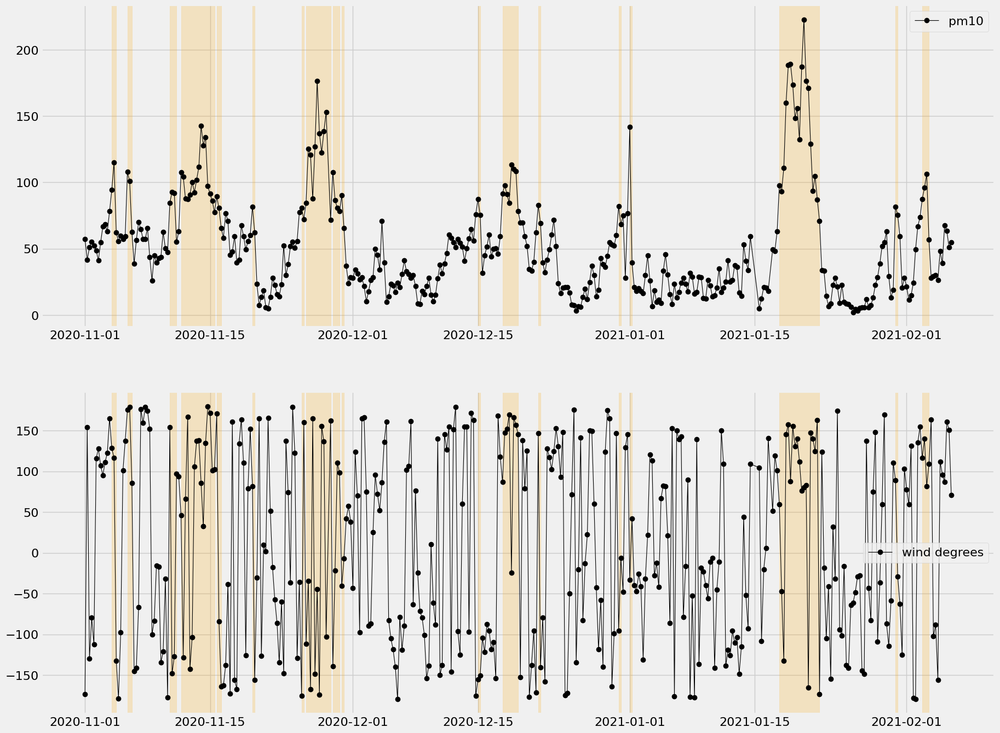

In [202]:
sz = datetime.datetime.strptime("2020-11-01", '%Y-%m-%d')
ez = datetime.datetime.strptime("2021-02-06", '%Y-%m-%d')

fig, axs = plt.subplots(2,1)

axs[0].plot(wiseairPM_pot_data.dropna()[sz:ez]["pm10SPS"], color = "black", marker = 'o', linewidth=0.8, 
            label = "pm10")
plot_peaks(axs[0], detect_peaks(wiseairPM_pot_data["pm10SPS"][sz:ez], 80))
axs[0].legend()

degrees = np.arctan2(wiseairPM_pot_data.dropna()[sz:ez]["sin_wd"], 
                     wiseairPM_pot_data.dropna()[sz:ez]["cos_wd"])*180/np.pi

axs[1].plot(degrees, color = "black", marker = 'o', linewidth=0.8, label = "wind degrees")
plot_peaks(axs[1], detect_peaks(wiseairPM_pot_data["pm10SPS"][sz:ez], 80))
axs[1].legend()

plt.gcf().set_size_inches(20, 16)
plt.show()

# lo 0 è riferito al nord, quindi 180 sono il sud

possibile che l'assenza di fenomeni atmosferici per un periodo prolungato porti ad un aumento dei valori di pm?? improbabile, perchè ci sono altre zone della serie dove non accade nulla dal punto di vista atmosferico e comunque i livelli di PM continuano a mantenersi bassi... 

nella regione 17 gennaio 21 gennaio, fà freddo, il tempo è umido, non c'è un vento importante e non piove molto... può essere l'unione di queste circostanze la causa di questo incremento??

inoltre ARPA che fornisce dati più affidabili non mostra quel picco così accentuato...

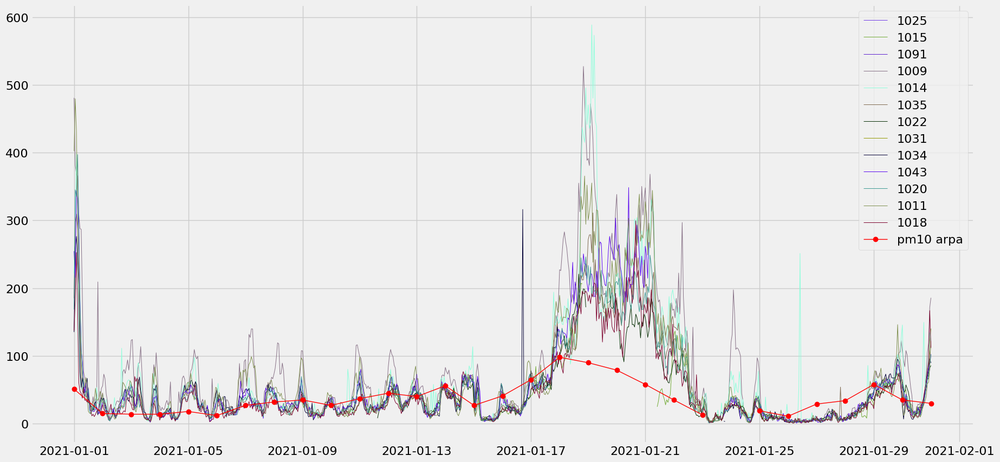

In [84]:
sensorsToPlot = [1025, 1015, 1091, 1009, 1014, 1035, 1022, 1031, 1034, 1043, 1020, 1011, 1018]
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(sensorsToPlot), replace=False)

for j,i in enumerate(sensorsToPlot):
    tmp = wiseairPM_data.loc[wiseairPM_data['pot_id'] == i]
    tmp = tmp[startDate : endDate]
    
    tmp['hour'] = [d.strftime('%H') for d in tmp.index]
    tmp['colid'] = range(len(tmp['hour']))
    plt.plot(tmp['pm10SPS'], color = mycolors[j], label = i, linewidth = 0.7)
    
plt.plot(arpaPM_data["PM10.Arpa"][startDate:endDate], 
         color = "red", marker = 'o', linewidth=1.0, label = "pm10 arpa")
plt.gcf().set_size_inches(20, 10)
plt.legend()
plt.show()

il picco non è rilevato da ARPA ma è comune tra i diversi pot...

In [ ]:
Ytrain1W = Ytrain1W.join(wiseairPM_pot_data["RI"], how='inner')

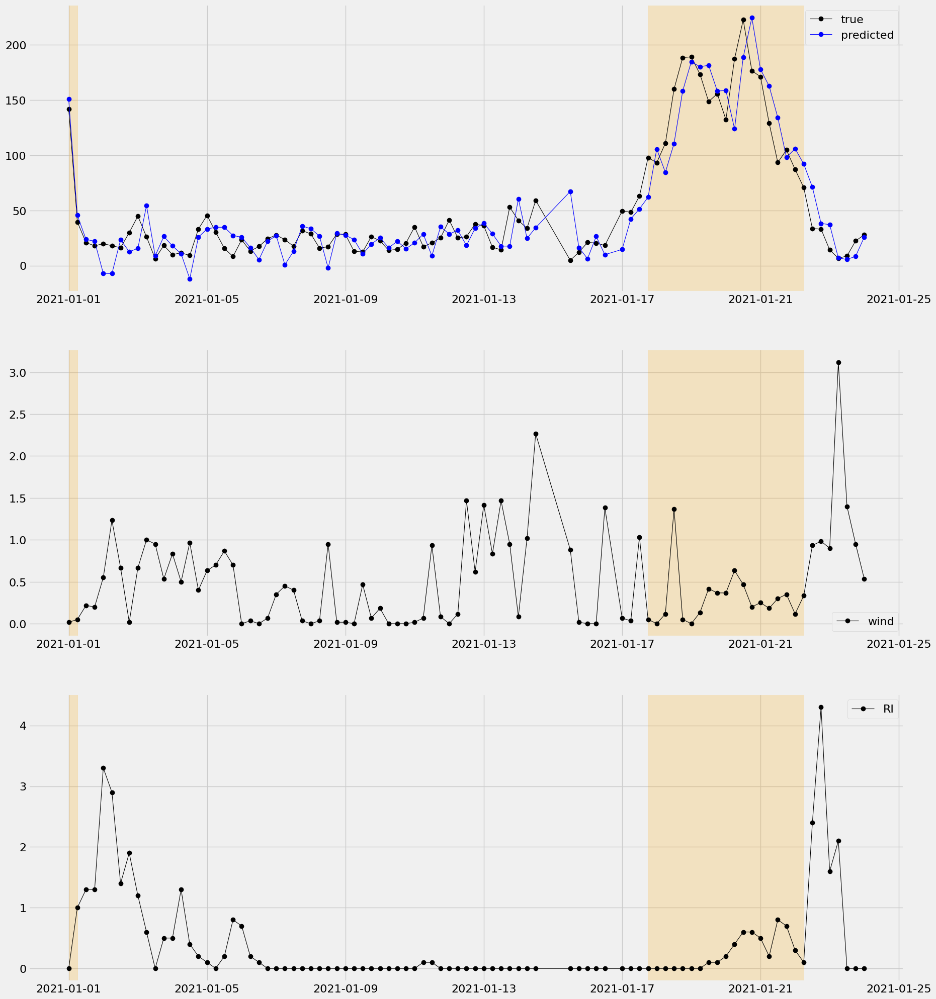

In [313]:
def plotFitWithRegressors(fit, data, target, regressors, start, end):
    startZoom = datetime.datetime.strptime(start, '%Y-%m-%d')
    endZoom   = datetime.datetime.strptime(end,   '%Y-%m-%d')
    
    fit_mean = fit.mean().numpy()
    fit_stddev = fit.stddev().numpy()
    
    fittedDF    = pd.DataFrame({'yF' : fit_mean, 'xF' : pd.to_datetime(data[target].index)})
    fittedDF.set_index("xF", inplace=True)
    
    # compute standardized residuals
    res = (data[target] - fit_mean)/fit_stddev

    # detect peaks
    peaks = detect_peaks(data[startZoom:endZoom][target], 80)
    
    fig, axs = plt.subplots(len(regressors)+1,1)
    axs[0].plot(data[startZoom:endZoom][target], color = "black", marker = 'o', linewidth=0.8, 
                label = "true")
    axs[0].plot(fittedDF['yF'][startZoom:endZoom], color = "blue", marker = 'o', linewidth=0.8, 
                label = "predicted")
    plot_peaks(axs[0], peaks)
    axs[0].legend()
    
    for i,j in enumerate(regressors):
        axs[i+1].plot(data[startZoom:endZoom][j], color = "black", marker = 'o', linewidth=0.8, label = j)
        plot_peaks(axs[i+1], peaks)
        axs[i+1].legend()

    plt.gcf().set_size_inches(20, 8*(len(regressors)+1))
    plt.show()
    
plotFitWithRegressors(fit, Ytrain1W, "pm10SPS", ["wind", "RI"], "2021-01-01", "2021-01-24")

In [308]:
def MAPE(true_data, predicted_value):
    errors = np.absolute(true_data - predicted_value)
    percentage_errors = errors/true_data
    
    return 100*(1/true_data.size)*np.sum(percentage_errors)

MAPE(pm10, fit.mean().numpy())

58.566538492838546

:(

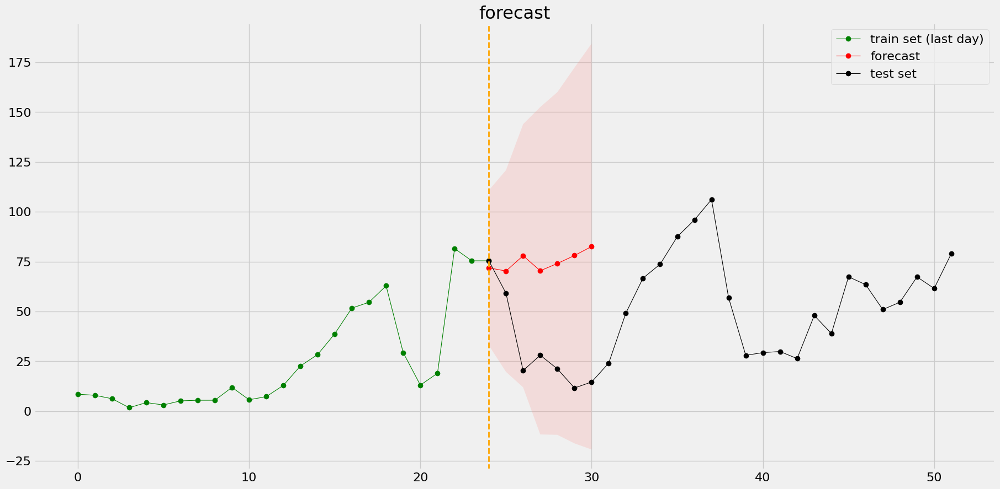

In [248]:
forecast = tfp.sts.forecast(
    observed_time_series = pm10,
    model                = model,
    parameter_samples    = sample,
    num_steps_forecast   = 7
)

plotForecast_sts(Ytest1W['pm10SPS'], pm10, 24, forecast, "forecast")

## proviamo il modello su dati ARPA

In [244]:
# load ARPA PM data
prior_arpa_data = pd.read_csv("../data/datiArpaPM-01122019-01032020.csv", names=["Date", "pm10"], header=0)[2:]

prior_arpa_data["Date"] = pd.to_datetime(prior_arpa_data["Date"])
prior_arpa_data.set_index("Date", inplace=True)
prior_arpa_data["pm10"] = pd.to_numeric(prior_arpa_data["pm10"])

# mark missing values -999 as NaN
prior_arpa_data.loc[prior_arpa_data["pm10"] == -999, "pm10"] = None

prior_arpa_data.head()

,pm10
Date,
2019-12-01,30.0
2019-12-02,18.0
2019-12-03,19.0
2019-12-04,24.0
2019-12-05,53.0


In [237]:
pm10 = np.array(arpaPM_data["PM10.Arpa"].interpolate(), dtype="float32")

rainLevel = pd.read_csv('../data/datiArpaPrecipitazioni-01052020-07022021.csv', 
                        names=["ID", "Date", "rain"], header=0)
rainLevel.drop("ID", axis = 1, inplace = True)
rainLevel["Date"] = pd.to_datetime(rainLevel["Date"])
rainLevel.set_index("Date", inplace=True)

def RI(p1, p2):
    return min(p1,p2) + 0.5*(max(p1,p2) - min(p1,p2))

rain = rainLevel["rain"].to_numpy()
rain_shift = rainLevel["rain"].shift(1).to_numpy()

rainfall_intensity = []

for i in range(len(rain)):
    rainfall_intensity.append(RI(rain[i], rain_shift[i]))
    
rainfall_intensity = pd.Series(rainfall_intensity, index = rainLevel["rain"].index)

temperature = pd.read_csv('../data/datiArpaTemperatura-01052020-07022021.csv', 
                        names=["ID", "Date", "temp-mean-hour"], header=0)
temperature.drop(["ID"], axis = 1, inplace = True)
temperature["Date"] = pd.to_datetime(temperature["Date"])
temperature.set_index("Date", inplace=True)

windDirection = pd.read_csv('../data/datiArpaDirezioneVento-01052020-07022021.csv', 
                        names=["ID", "Date", "wind_degree"], header=0)
windDirection.drop(["ID"], axis = 1, inplace = True)
windDirection["Date"] = pd.to_datetime(windDirection["Date"])
windDirection.set_index("Date", inplace=True)

windSpeed = pd.read_csv('../data/datiArpaVento-01052020-07022021.csv', 
                        names=["ID", "Date", "wind"], header=0)
windSpeed.drop("ID", axis = 1, inplace = True)
windSpeed["Date"] = pd.to_datetime(windSpeed["Date"])
windSpeed.set_index("Date", inplace=True)

humidity = pd.read_csv('../data/datiArpaUmidita-01052020-07022021.csv', 
                        names=["ID", "Date", "humi-mean-hour"], header=0)
humidity.drop(["ID"], axis = 1, inplace = True)
humidity["Date"] = pd.to_datetime(humidity["Date"])
humidity.set_index("Date", inplace=True)

arpaDF = pd.DataFrame({
    'RI' : rainfall_intensity.resample('D').max(),
    'temperature' : temperature["temp-mean-hour"].resample('D').mean(),
    'sin_wd' : np.sin(np.pi*windDirection["wind_degree"]/180).resample('D').mean(),
    'cos_wd' : np.cos(np.pi*windDirection["wind_degree"]/180).resample('D').mean(),
    'wind' : windSpeed["wind"].resample("D").mean(),
    'humidity' : humidity["humi-mean-hour"].resample("D").mean(),
    'pm10' : pm10,
    'solar_radiation' : solarRadiation["radiation"].resample("D").mean()
})

arpaDF = arpaDF.join(dummy_direction, how = "inner")

#arpaDF = (arpaDF - arpaDF.mean())/arpaDF.std()
#arpaDF = (arpaDF - arpaDF.min())/(arpaDF.max() - arpaDF.min())
arpaDF = arpaDF.astype("float32")

arpaDF["wind_degree"] = np.arctan2(arpaDF["sin_wd"],arpaDF["cos_wd"])*180/np.pi

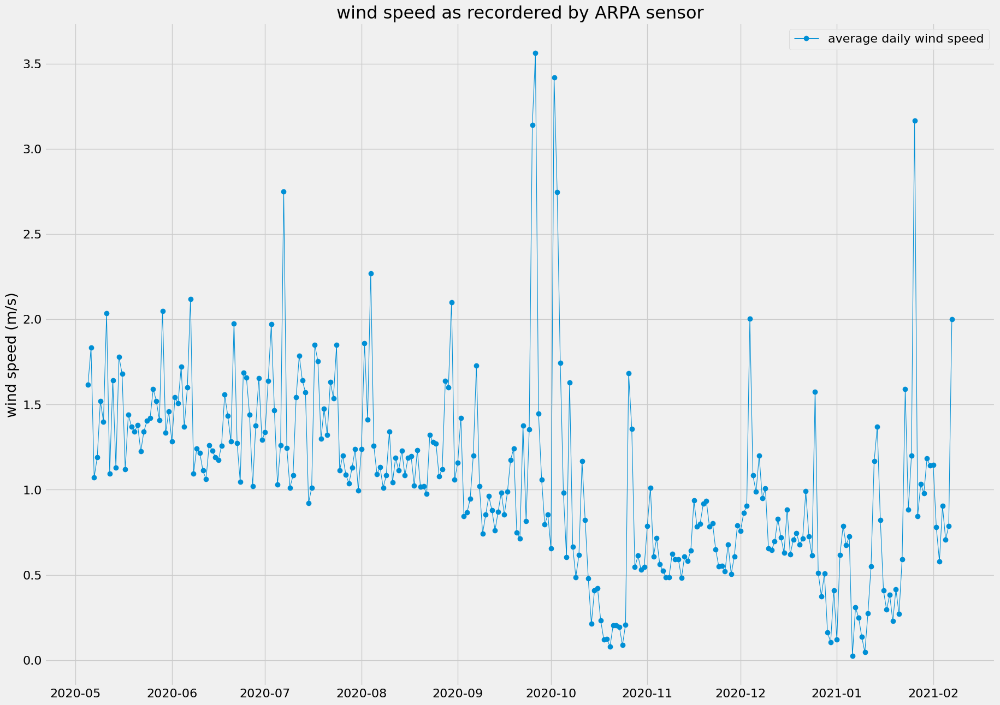

In [220]:
plt.plot(arpaDF["wind"], linewidth = 0.8, marker = 'o', 
            label = "average daily wind speed")
plt.title("wind speed as recordered by ARPA sensor")
plt.ylabel("wind speed (m/s)")
plt.legend()

plt.gcf().set_size_inches(20, 15)
plt.show()

In [171]:
import statsmodels.api as sm

variables = arpaDF
variables["t-1"] = arpaDF["pm10"].shift(1)
variables["t-2"] = arpaDF["pm10"].shift(2)
variables.dropna(inplace = True)

target = np.array(arpaDF["pm10"])
variables = arpaDF.drop(["pm10", "NE", "SE", "SW", "NW", "wind_degree"], axis = 1)

modelStatic = sm.OLS(target, variables).fit()


modelStatic.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.925
Model:                            OLS   Adj. R-squared (uncentered):              0.922
Method:                 Least Squares   F-statistic:                              370.0
Date:                Sun, 14 Feb 2021   Prob (F-statistic):                   2.73e-146
Time:                        16:49:07   Log-Likelihood:                         -1019.7
No. Observations:                 279   AIC:                                      2057.
Df Residuals:                     270   BIC:                                      2090.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
RI                 -0.5209      0.207     -2.511      0.013      -0.929      -0.113
temperature        -0.2518      0.127     -1.979      0.049      -0.502      -0.001
sin_wd              0.0332      1.486      0.022      0.982      -2.892       2.958
cos_wd             -1.7244      2.318     -0.744      0.457      -6.287       2.838
wind               -5.1380      1.239     -4.147      0.000      -7.577      -2.699
humidity            0.1285      0.021      6.257      0.000       0.088       0.169
solar_radiation     0.0351      0.011      3.328      0.001       0.014       0.056
t-1                 0.8522      0.059     14.483      0.000       0.736       0.968
t-2                -0.0629      0.056     -1.115      0.266      -0.174       0.048
==============================================================================
Omnibus:                       14.128   Durbin-Watson:                   2.055
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               34.620
Skew:                          -0.078   Prob(JB):                     3.04e-08
Kurtosis:                       4.719   Cond. No.                         849.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [173]:
OLS = modelStatic.params
STD = modelStatic.bse

In [238]:
pm10 = arpaDF["pm10"][startDate:endDate]
Y = arpaDF[startDate:endDate + timedelta(fdays)]

# define a design matrix for each regressors
rainDF = pd.DataFrame({
    'rain_intensity' : np.array(Y['RI'], dtype = "float32")
})
rainDF.dropna(inplace = True)

windDF = pd.DataFrame({
    'wind'     : np.array(Y['wind'], dtype = "float32"),
    'wind-sin' : np.array(Y['sin_wd'], dtype = "float32"),
    'wind-cos' : np.array(Y['cos_wd'], dtype = "float32"),
    'NE' : np.array(Y['NE'], dtype = "float32"),
    'SE' : np.array(Y['SE'], dtype = "float32"),
    'SW' : np.array(Y['SW'], dtype = "float32"),
    'NW' : np.array(Y['NW'], dtype = "float32")
})
windDF.dropna(inplace = True)

tempDF = pd.DataFrame({
    'temp' : np.array(Y['temperature'], dtype = "float32"),
    #'temp-diff': np.array((Y['temperature'] - Y['temperature'].shift(1)).fillna(Y['temperature']), 
    #                      dtype = "float32")
})
tempDF.interpolate(inplace = True)

humiDF = pd.DataFrame({
    'humi' : np.array(Y['humidity'], dtype = "float32")
})
humiDF.interpolate(inplace = True)

radiationDF = pd.DataFrame({
    'radiation' : np.array(Y['solar_radiation'], dtype = "float32")
})
radiationDF.interpolate(inplace = True)

In [302]:
# dynamical regressive part
wind_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(windDF.to_numpy(), (-1, windDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [OLS["wind"],
                                                                           OLS["sin_wd"],
                                                                           OLS["cos_wd"],
                                                                           -2, -10, -10, -5],
                                                                    scale_diag = [STD["wind"],
                                                                                 STD["sin_wd"],
                                                                                 STD["cos_wd"],
                                                                                 1,1,1,1]),
    name = "wind_effect"
)

rain_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(rainDF.to_numpy(), (-1, rainDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [-5], scale_diag = [STD["RI"]]),
    name = "rain_effect"
)

temp_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(tempDF.to_numpy(), (-1, tempDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(#loc = [OLS["temperature"]],
                                                                     loc = [0],
                                                                     scale_diag = [STD["temperature"]]),
    name = "temperature_effect"
)

humi_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(humiDF.to_numpy(), (-1, humiDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [OLS["humidity"]], 
                                                                     scale_diag = [STD["humidity"]]),
    name = "humidity_effect"
)

solar_effect = tfp.sts.DynamicLinearRegression(
    design_matrix = tf.reshape(radiationDF.to_numpy(), (-1, radiationDF.shape[1])),
    initial_weights_prior = tfp.distributions.MultivariateNormalDiag(loc = [OLS["solar_radiation"]], 
                                                                     scale_diag = [STD["solar_radiation"]]),
    name = "radiation_effect"
)

# autoregressive part
autoregressive = tfp.sts.Autoregressive(
      order = 2,
      observed_time_series = np.array(pm10, dtype="float32"),
      coefficients_prior = tfp.distributions.MultivariateNormalDiag(loc = [OLS["t-1"], OLS["t-2"]], 
                                                                    scale_diag = [STD["t-1"], STD["t-2"]]),
      name='autoregressive'
)

# trend part
trend = tfp.sts.SemiLocalLinearTrend(
    observed_time_series = pm10
)

startDatePrior = datetime.datetime.strptime("2020-01-01", '%Y-%m-%d')
endDatePrior   = datetime.datetime.strptime("2020-02-28", "%Y-%m-%d")

prior_arpa_data = prior_arpa_data[startDatePrior:endDatePrior]
prior_arpa_data = prior_arpa_data.resample('D').mean()

prior_arpa_data['day'] = prior_arpa_data.index.strftime("%A")

week_of_day_prior = prior_arpa_data.groupby(by = "day").mean()["pm10"]
# reindex so to be aligned with periodicity of train set
week_of_day_prior = week_of_day_prior.reindex(pm10.index.strftime("%A")[0:7].values)

# seasonal part
day_of_week_effect = tfp.sts.Seasonal(
    num_seasons = 7,
    observed_time_series = np.array(pm10, dtype="float32"),
    name='day_of_week_effect',
    drift_scale_prior=tfp.distributions.LogNormal(loc=-1.0, scale=10.0),
    initial_effect_prior = tfp.distributions.MultivariateNormalDiag(loc = np.array(week_of_day_prior.values, 
                                                                                   dtype = "float32"))
)

In [303]:
observation_noise_scale_prior = tfp.distributions.InverseGamma(concentration = 1.0, scale = 1.0)

model = tfp.sts.Sum([autoregressive,
                     #trend,
                     wind_effect,
                     rain_effect,
                     humi_effect,
                     temp_effect,
                     solar_effect,
                     day_of_week_effect
                    ], 
                    observed_time_series = np.array(pm10, dtype="float32"),
                    observation_noise_scale_prior = observation_noise_scale_prior)

In [306]:
parameters_sample = fit_to_data(model, pm10, 10000)
sample = parameters_sample[1]

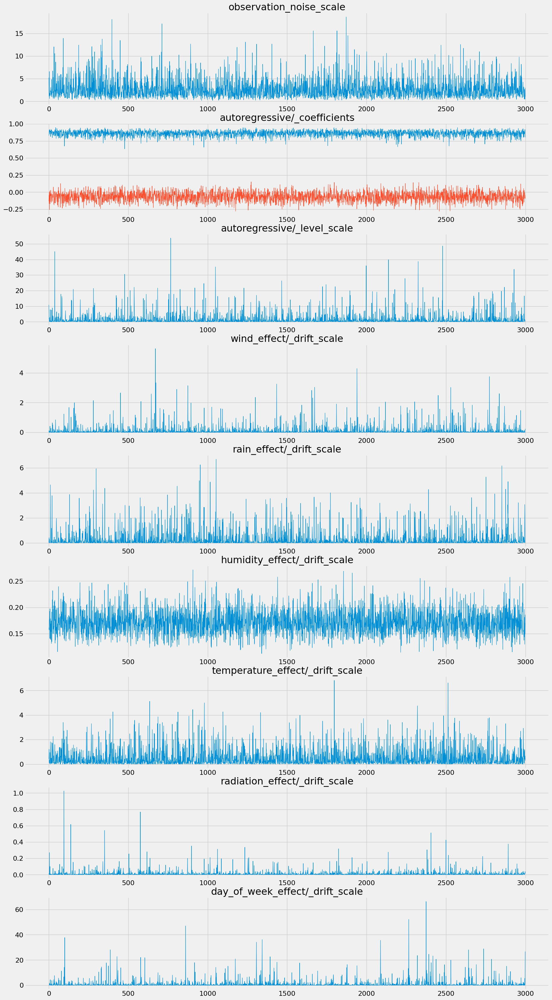

In [177]:
plotTraceplots_sts(sample)

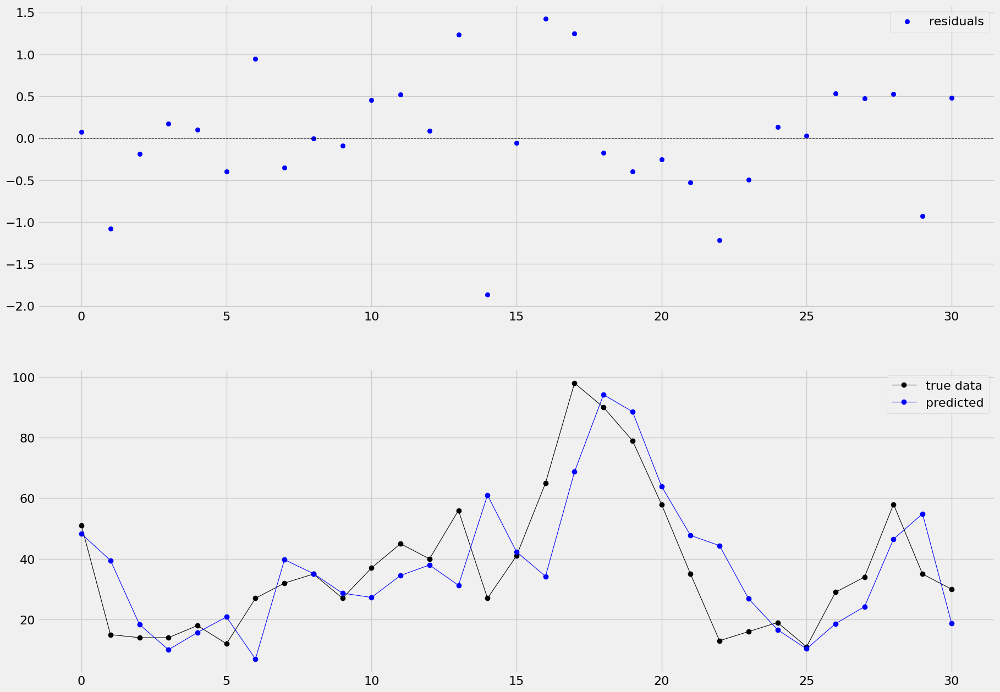

In [307]:
fit = tfp.sts.one_step_predictive(
    observed_time_series = pm10,
    model                = model,
    parameter_samples    = sample
)

plotResiduals_sts(pm10, fit)

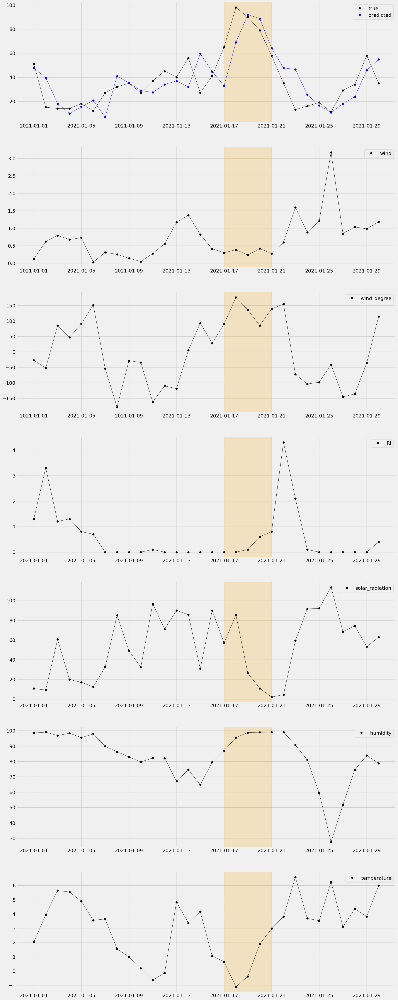

In [277]:
def plotFitWithRegressors(fit, data, target, regressors, start, end):
    startZoom = datetime.datetime.strptime(start, '%Y-%m-%d')
    endZoom   = datetime.datetime.strptime(end,   '%Y-%m-%d')
    
    fit_mean = fit.mean().numpy()
    fit_stddev = fit.stddev().numpy()
    
    fittedDF    = pd.DataFrame({'yF' : fit_mean, 'xF' : pd.to_datetime(data[target].index)})
    fittedDF.set_index("xF", inplace=True)
    
    # compute standardized residuals
    res = (data[target] - fit_mean)/fit_stddev

    # detect peaks
    peaks = detect_peaks(data[startZoom:endZoom][target], 60)
    
    fig, axs = plt.subplots(len(regressors)+1,1)
    axs[0].plot(data[startZoom:endZoom][target], color = "black", marker = 'o', linewidth=0.8, 
                label = "true")
    axs[0].plot(fittedDF['yF'][startZoom:endZoom], color = "blue", marker = 'o', linewidth=0.8, 
                label = "predicted")
    plot_peaks(axs[0], peaks)
    axs[0].legend()
    
    for i,j in enumerate(regressors):
        axs[i+1].plot(data[startZoom:endZoom][j], color = "black", marker = 'o', linewidth=0.8, label = j)
        plot_peaks(axs[i+1], peaks)
        axs[i+1].legend()

    plt.gcf().set_size_inches(20, 8*(len(regressors)+1))
    plt.show()
    
plotFitWithRegressors(fit, arpaDF[startDate:endDate], "pm10", ["wind",
                                                               "wind_degree",
                                                               "RI", 
                                                               "solar_radiation", 
                                                               "humidity", 
                                                               "temperature"], "2021-01-01", "2021-01-30")

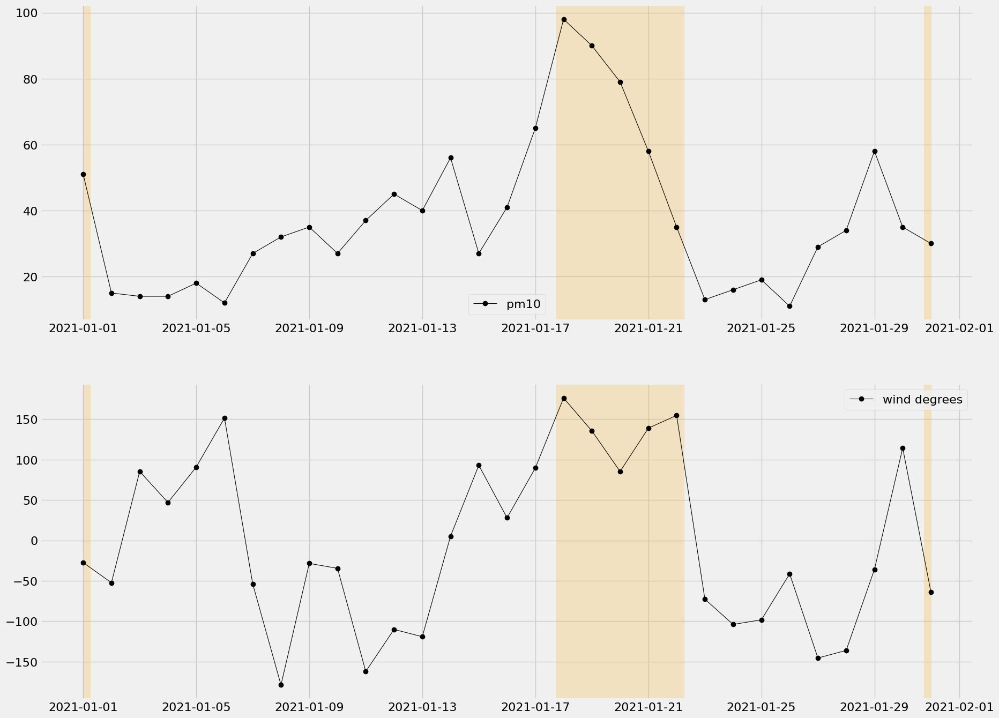

In [423]:
fig, axs = plt.subplots(2,1)

axs[0].plot(Y.dropna()["pm10"][startDate:endDate], color = "black", marker = 'o', linewidth=0.8, label = "pm10")
plot_peaks(axs[0], p)
axs[0].legend()

degrees = np.arctan2(Y.dropna()["sin_wd"][startDate:endDate], Y.dropna()["cos_wd"][startDate:endDate])*180/np.pi

axs[1].plot(degrees, color = "black", marker = 'o', linewidth=0.8, label = "wind degrees")
plot_peaks(axs[1], p)
axs[1].legend()

plt.gcf().set_size_inches(20, 16)
plt.show()

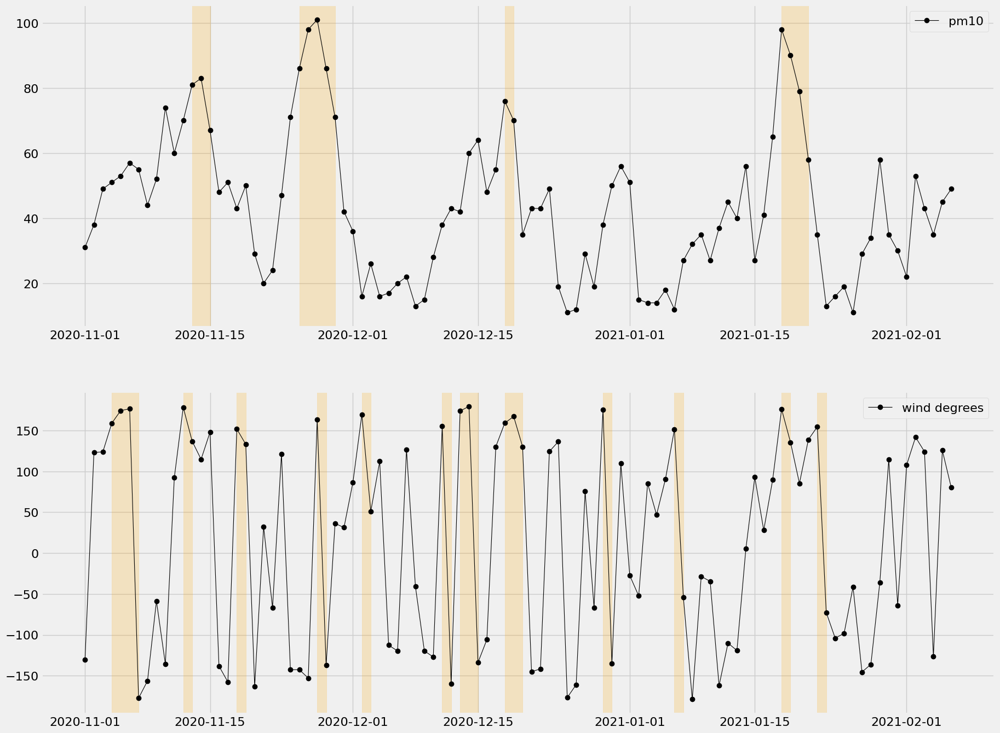

Date
2020-11-01   -130.480728
2020-11-02    123.098000
2020-11-03    123.852463
2020-11-04    158.918640
2020-11-05    174.343491
Freq: D, dtype: float32

In [778]:
sz = datetime.datetime.strptime("2020-11-01", '%Y-%m-%d')
ez = datetime.datetime.strptime("2021-02-06", '%Y-%m-%d')

degrees = np.arctan2(arpaDF.dropna()[sz:ez]["sin_wd"], 
                     arpaDF.dropna()[sz:ez]["cos_wd"])*180/np.pi

fig, axs = plt.subplots(2,1)

axs[0].plot(arpaDF.dropna()[sz:ez]["pm10"], color = "black", marker = 'o', linewidth=0.8, 
            label = "pm10")
plot_peaks(axs[0], detect_peaks(arpaDF.dropna()[sz:ez]["pm10"], 75))
axs[0].legend()

axs[1].plot(degrees, color = "black", marker = 'o', linewidth=0.8, label = "wind degrees")
#axs[1].plot(arpaDF.dropna()[sz:ez]["wind"], color = "black", marker = 'o', linewidth=0.8, label = "wind degrees")

plot_peaks(axs[1], detect_peaks(pd.Series(degrees), 150))
axs[1].legend()

plt.gcf().set_size_inches(20, 16)
plt.show()

degrees.head()

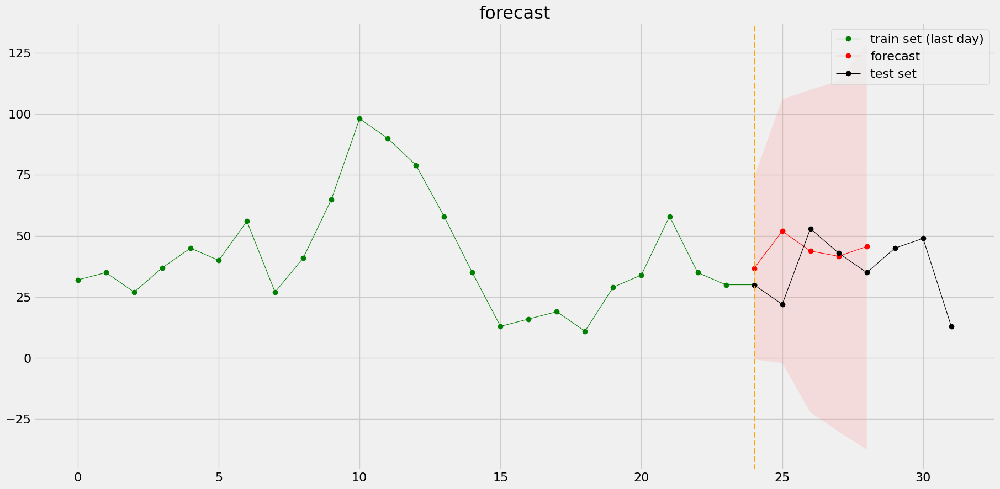

In [154]:
forecast = tfp.sts.forecast(
    observed_time_series = pm10,
    model                = model,
    parameter_samples    = sample,
    num_steps_forecast   = 5
)

plotForecast_sts(arpaDF["pm10"][endDate:endDate + timedelta(fdays)], pm10, 24, forecast, "forecast")

In [766]:
startDatePrior = datetime.datetime.strptime("2020-09-01", '%Y-%m-%d')
endDatePrior   = datetime.datetime.strptime("2020-12-31", "%Y-%m-%d")

prior_arpa_data = arpaDF[startDatePrior:endDatePrior]
prior_arpa_data = prior_arpa_data.resample('D').mean()

prior_arpa_data['day'] = prior_arpa_data.index.strftime("%A")

week_of_day_prior = prior_arpa_data.groupby(by = "day").mean()["pm10"]
# reindex so to be aligned with periodicity of train set
week_of_day_prior = week_of_day_prior.reindex(pm10.index.strftime("%A")[0:7].values)

week_of_day_prior

day
Friday       41.352940
Saturday     38.470589
Sunday       31.882353
Monday       33.764706
Tuesday      37.666668
Wednesday    36.500000
Thursday     39.666668
Name: pm10, dtype: float32

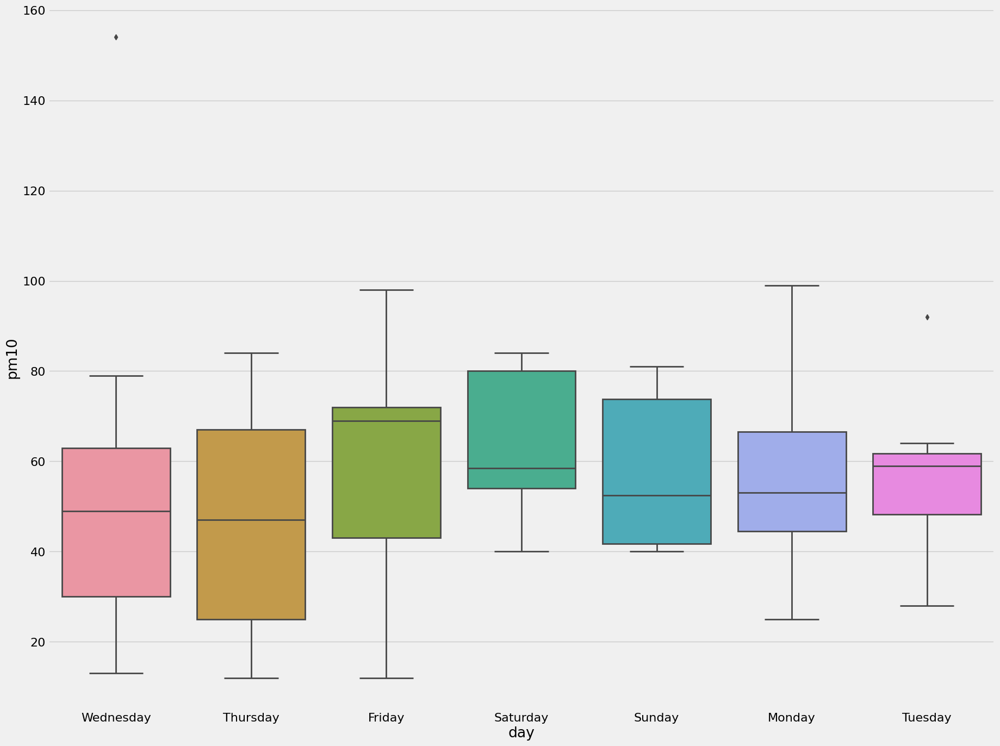

In [250]:
import seaborn as sns

pad = prior_arpa_data.groupby(by = "day")

sns.boxplot(x="day", y="pm10", data=prior_arpa_data)
plt.gcf().set_size_inches(20, 16)

In [309]:
wiseairPM_pot_data.head()

,pot_id,pm1SPS,pm2p5SPS,pm4SPS,pm10SPS,temperature_sht,humidity_sht,latitude,longitude,weekend,wind,rain,RI,wd,sin_wd,cos_wd
created_at,,,,,,,,,,,,,,,,
2020-06-24 12:00:00,1018,6.649960,7.322917,7.575096,7.623598,32.621963,31.290865,45.484161,9.209361,0,2.125000,0.0,0.0,110,0.908007,-0.327169
2020-06-24 18:00:00,1018,5.469028,6.208333,6.418333,6.475694,31.926111,29.318611,45.484161,9.209361,0,1.816667,0.0,0.0,99,0.987658,-0.138791
2020-06-25 00:00:00,1018,3.885000,4.000000,4.110000,4.110000,29.920000,32.695000,45.484161,9.209361,0,1.133333,0.0,0.0,66,0.899524,0.382489
2020-06-25 06:00:00,1018,12.915000,14.330556,15.062639,15.189000,24.638194,43.087500,45.484161,9.209361,0,2.016667,0.0,0.0,76,0.947740,0.080470
2020-06-25 12:00:00,1018,6.970500,7.750000,8.000500,8.056500,29.623000,37.384500,45.484161,9.209361,0,1.933333,0.0,0.0,100,0.700675,-0.598768


In [310]:
component_dists = tfp.sts.decompose_by_component(
    model,
    observed_time_series = pm10,
    parameter_samples    = sample
)

model_component_means_, model_component_stddevs_ = (
    {k.name: c.mean() for k, c in component_dists.items()},
    {k.name: c.stddev() for k, c in component_dists.items()}
)

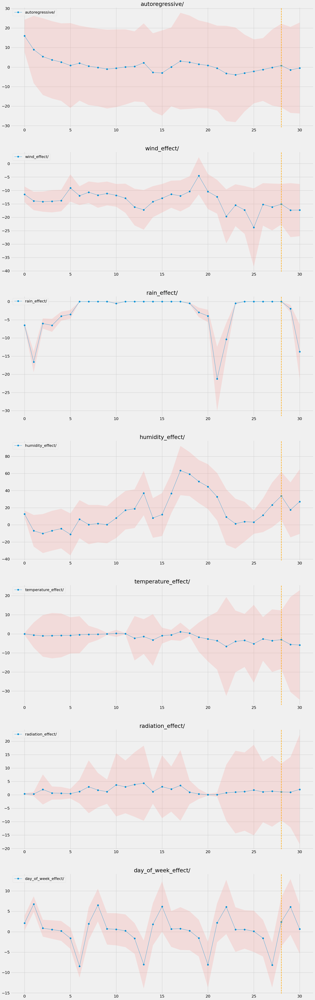

In [320]:
import collections

fig, axs = plt.subplots(len(model_component_means_.keys()),1)

for i, componentName in enumerate(model_component_means_.keys()):
    componentDF = pd.DataFrame({
        'yF'   : model_component_means_[componentName], 
        'xF'   : range(model_component_means_[componentName].shape[0]),
        'ylow' : model_component_means_[componentName] - 2*model_component_stddevs_[componentName],
        'yup'  : model_component_means_[componentName] + 2*model_component_stddevs_[componentName]
    })

    axs[i].plot('xF', 'yF', data = componentDF, linewidth = 0.8, marker = 'o', label = componentName)
    axs[i].set_title(componentName)
    axs[i].fill_between('xF', 'ylow', 'yup', data = componentDF, facecolor = "#ff8a82", alpha = 0.2)
    axs[i].axvline(x = componentDF['yF'].size - 3, linestyle = "dashed", color = "orange")
    axs[i].legend()
    
plt.gcf().set_size_inches(20, 10*len(model_component_means_.keys()))
plt.show()

In [319]:
model_component_means_['autoregressive/'].shape[0]

31